In [1]:
import os
import math
import matplotlib.pyplot as plt
import matplotlib.patches as mpatches
import numpy as np
#import pandas as pd
from matplotlib.patches import Rectangle, Circle
%matplotlib inline
from astropy.wcs import WCS
from astropy.io import fits
from astropy.utils.data import get_pkg_data_filename
from astropy.visualization.wcsaxes import WCSAxes, add_beam
from astropy.coordinates import SkyCoord, ICRS
import astropy.units as u
from matplotlib import pyplot, image, transforms, gridspec
import scipy.stats

#Image import

#Hubble - F435W
hubble = fits.open("j92103040_drz.fits")[1]
wcsHubble = WCS(hubble.header)

#Chandra - NGC6266
hduChandra = fits.open("Chandra/NGC6266/primary/acisf02677N004_cntr_img2.fits")[0] #3040_drz.chip1.fits is what I've been using so far
wcsChandra = WCS(hduChandra.header)

#Data import

xPos, yPos, C, objType, error, sharpness, roundness, crowding, mag435, sig435, mag625, sig625, mag658, sig658, counts435, counts625, counts658 = np.loadtxt('noAlignment/magsNoAlignment.txt', unpack = True)
sep, chandraRAh, chandraRAm, chandraRAs, chandraDECd, chandraDECm, chandraDECs, chandraErrR1, chandraErrR2, chandraErrTheta, sigma, flux, fluxH, fluxM, fluxS = np.loadtxt('chandra2.txt', unpack=True)

#Convert counts to flux
#Distance = 6470 pc * (3.086E13 km/pc) = 1.997E17 km = 1.997E20 m = 1.997E22 cm
#distCM = 1.997e20
#area = 4*math.pi*(distCM**2) #surface area of chandra star at our current distance
#totalXFlux = flux[i] * area #total flux emitted from star should be whatever we measure times the surface area in cm^2

#Define class for candidates

class candidate:
    def __init__(self, name, parent, X, Y, chi, objType, error, sharpness, roundness, crowding, mag435, sig435, mag625, sig625, mag658, sig658, brColor, hrColor, optFlux):
        self.name = name #name
        self.parent = parent #which chandra object is this candidate associated with?
        self.X = X #pixel horizontal position on hubble
        self.Y = Y #pixel vertical position
        self.chi = chi
        self.objType = objType #DOLPHOT object type
        self.error = error #DOLPHOT error flag
        self.sharpness = sharpness
        self.roundness = roundness
        self.crowding = crowding
        self.mag435 = mag435
        self.sig435 = sig435
        self.mag625 = mag625
        self.sig625 = sig625
        self.mag658 = mag658
        self.sig658 = sig658
        self.brColor = brColor
        self.hrColor = hrColor
        #self.flux435 = counts435 #m = C - 2.5logF    C ~= 33.874
        #self.flux625 = counts625
        #self.flux658 = counts658
        self.flux = optFlux
        
    
    
#and a class for Chandra objects
class chandra:
    def __init__(self, target, name, RA, DEC, errorR1, errorR2, errorTheta, sigma, X, Y, lx, flux, fluxH, fluxM, fluxS, emitter, starType, confidence):
        self.target = target
        self.name = name
        self.RA = RA #detection RA, reported by chandra
        self.DEC = DEC #detected DEC
        self.errorR1 = errorR1 #major axis error in arcseconds
        self.errorR2 = errorR2 #minor axis error in arcseconds
        self.errorTheta = errorTheta #angle from true north of the error elipse
        self.sigma = sigma
        self.X = X #pixel horizontal position, calculated onto hubble
        self.Y = Y #pixel vertical position
        self.lx = lx #x-ray luminosity, in ergs/s
        self.flux = flux #flux, in ergs/s/cm^2
        self.fluxHard = fluxH
        self.fluxMedium = fluxM
        self.fluxSoft = fluxS
        self.emitter = emitter
        self.starType = starType
        self.confidence = confidence
        
#Create list of Chandra targets

def isWithinHalfLight(ra, dec): #for excluding distant Chandra objects
    
    pos = SkyCoord(RA, DEC, frame='icrs')
    pos = pos.transform_to('fk5') #converting to match Hubble ACS
    x, y = wcsHubble.world_to_pixel_values(pos.ra, pos.dec) #x, y position of chandra star
    
    centerRA, centerDEC = '17h01m12.60s', '-30d06m44.5s' #center of cluster via SIMBAD

    posCenter = SkyCoord(centerRA, centerDEC, frame='icrs')
    posCenter = posCenter.transform_to('fk5') #converting to match Hubble ACS
    xCenter, yCenter = wcsHubble.world_to_pixel_values(posCenter.ra, posCenter.dec) #x & y pixel position of cluster center
    
    #is the candidate star within the half-light radius of this cluster?
    
    if ((x - xCenter)**2 + (y-yCenter)**2)**(1/2) <= 1159:
        return True
    else:
        return False


chandraTargets = []

for i in range(len(chandraRAh)):
    
    #raOffset = 

    RA = str(int(chandraRAh[i]))+'h'+str(int(chandraRAm[i]))+'m'+str(chandraRAs[i])+'s'
    DEC = str(int(chandraDECd[i]))+'d'+str(int(chandraDECm[i]))+'m'+str(chandraDECs[i])+'s'


    pos = SkyCoord(RA, DEC, frame='icrs')
    pos = pos.transform_to('fk5') #converting to match Hubble ACS
    x, y = wcsHubble.world_to_pixel_values(pos.ra, pos.dec)

    #Add boresight offsets
    x = x - 0.5981686426266606
    y = y -1.69229899126276
    
    #Correct ra & dec to match
    temp = wcsHubble.pixel_to_world(x, y)
    temp = temp.transform_to('icrs')
    RA = temp.ra
    DEC = temp.dec

    if i < 9:
        targName = "CX0" + str(i+1)
    else:
        targName = "CX" + str(i+1)

    #Convert flux to units of ergs/s
    #Distance = 6470 pc * (3.086E13 km/pc) = 1.997E17 km = 1.997E20 m = 1.997E22 cm
    distCM = 1.997e22
    area = 4*math.pi*(distCM**2) #surface area of chandra star at our current distance
    totalLX = flux[i] * area #total flux emitted from star should be whatever we measure times the surface area in cm^2
    
    #Include boresight offsets for chandraTargets[7] to align with known VLA source    
    chandraTarget = chandra("6266", targName, RA, DEC, 21*chandraErrR1[i], 21*chandraErrR2[i], chandraErrTheta[i], sigma[i], float(x), float(y), totalLX, flux[i], fluxH[i], fluxM[i], fluxS[i], '', '', '')
    if isWithinHalfLight(chandraTarget.RA, chandraTarget.DEC):
        chandraTargets.append(chandraTarget)
        
#Create a set of filters to iterate over
def scale_plot_size(factor=10):
    default_dpi = plt.rcParamsDefault['figure.dpi']
    plt.rcParams['figure.dpi'] = default_dpi*factor
    plt.rcParams['agg.path.chunksize'] = 1000

scale_plot_size(10)


def Filter(crowdingMax, roundnessMax, sharpnessMin, sharpnessMax, chiMax):
    
    
    global dolphotObjects
    dolphotObjects = []
    global candidates 
    candidates = []

    for i in range(len(objType)):
        if ((mag435[i] != 99.999) and (mag625[i] != 99.999) and (mag658[i] != 99.999) and (error[i] <= 3) and (objType[i] < 3) and (C[i] <= chiMax) and (crowding[i] <= crowdingMax) and (roundness[i] <= roundnessMax) and (sharpness[i] <= sharpnessMax) and (sharpness[i] >= sharpnessMin)):
            if i < 9:
                targName = "H_0" + str(i+1)
            else:
                targName = "H_" + str(i+1)
            
            optFlux = 1.07*10**(-(0.4*mag625[i]+6)) #from lugger (2017) section 4.5
            hubbleTarget = candidate(targName, "none", xPos[i], yPos[i], C[i], objType[i], error[i], sharpness[i], roundness[i], crowding[i], mag435[i], sig435[i], mag625[i], sig625[i], mag658[i], sig658[i], mag435[i]-mag625[i], mag658[i]-mag625[i], optFlux)
            dolphotObjects.append(hubbleTarget)
        
   
    for field in fields:
    
        #field is the image number, but python iterates from 0, so target will be field-1
        target = field-1
        
        for j in range(len(dolphotObjects)):
            if (((dolphotObjects[j].X - chandraTargets[target].X)**2+(dolphotObjects[j].Y - chandraTargets[target].Y)**2)**(1/2)) <= chandraTargets[target].errorR1:
                #Add these to a list of candidates
                dolphotObjects[j].parent = chandraTargets[target].name
                candidates.append(dolphotObjects[j])
        
        
        xMin = int(chandraTargets[target].X-50)
        xMax = int(chandraTargets[target].X+50)
        yMin = int(chandraTargets[target].Y-50)
        yMax = int(chandraTargets[target].Y+50)
        
        
        image_data_Hubble = hubble.data
        plotDataHubble = image_data_Hubble[xMin:xMax, yMin:yMax]

        fig, ax = plt.subplots()

        title = chandraTargets[target].name + ": cMax=" + str(crowdingMax) + ", rMax=" + str(roundnessMax) + ", " + str(sharpnessMin) + "<= s <= " + str(sharpnessMax) + ", chiMax=" + str(chiMax)
        plt.title(title)
        ax.imshow(image_data_Hubble, origin = 'lower', vmin= -5e3, vmax = 5e3, cmap = 'gray')
        ax.set_xlim(xMin, xMax)
        ax.set_ylim(yMin, yMax)
        
        r = Rectangle((chandraTargets[target].X-1, chandraTargets[target].Y-1), 1, 1, edgecolor = 'blue', facecolor = 'none')#, transform = ax.get_transform('pixel'))
        ax.add_patch(r)
        
        c = Circle((chandraTargets[target].X, chandraTargets[target].Y), chandraTargets[target].errorR1, edgecolor = 'yellow', facecolor = 'none')
        ax.add_patch(c)
        
        for j in range(len(candidates)):
            if candidates[j].parent == chandraTargets[target].name: #and candidates[j].mag625 >= 20.5:
                r2 = Rectangle((candidates[j].X-0.5,candidates[j].Y-0.5), 1, 1, edgecolor = 'green', facecolor = 'none')
                ax.add_patch(r2)
                
        #directory = 'C:\\Python\\' + str(crowdingMax) + '_' + str(roundnessMax) + '_' + str(sharpnessMin) + '_' + str(sharpnessMax) + '_' + str(chiMax) + '\\'
        #directory = 'C:\\Python\\CMDFiltered'  
        #if not os.path.isdir(directory):
          #os.mkdir(directory)
 
          
        #f = directory + chandraTargets[target].name + '___' + str(crowdingMax) + '_' + str(roundnessMax) + '_' + str(sharpnessMin) + '_' + str(sharpnessMax) + '_' + str(chiMax) + '.png'
        #f = directory + chandraTargets[target].name + '.png'
        #plt.savefig(f, bbox_inches='tight')
        #plt.show()
        plt.close(fig)

# Identify 4 fields - one very crowded w/ low detection, one very open with low detection, one in between, and
# one field with good results already for control
# Crowded, low - 6
# Open, low - 19
# Mid crowding - 11
# Control - 18
#
#Find a set of filters that gives good results on ALL of these images

#fields = [6, 19, 11, 18]
fields = np.arange(0,len(chandraTargets))


maxCrowding = 1.2 #  1.2
maxRoundness = 1 # 1
minSharp = -0.3 #   -0.3
maxSharp = 0.3 #     0.3
maxChi = 15 #         6

Filter(maxCrowding, maxRoundness, minSharp, maxSharp, maxChi)




Set MJD-END to 52407.130104 from DATE-END'. [astropy.wcs.wcs]


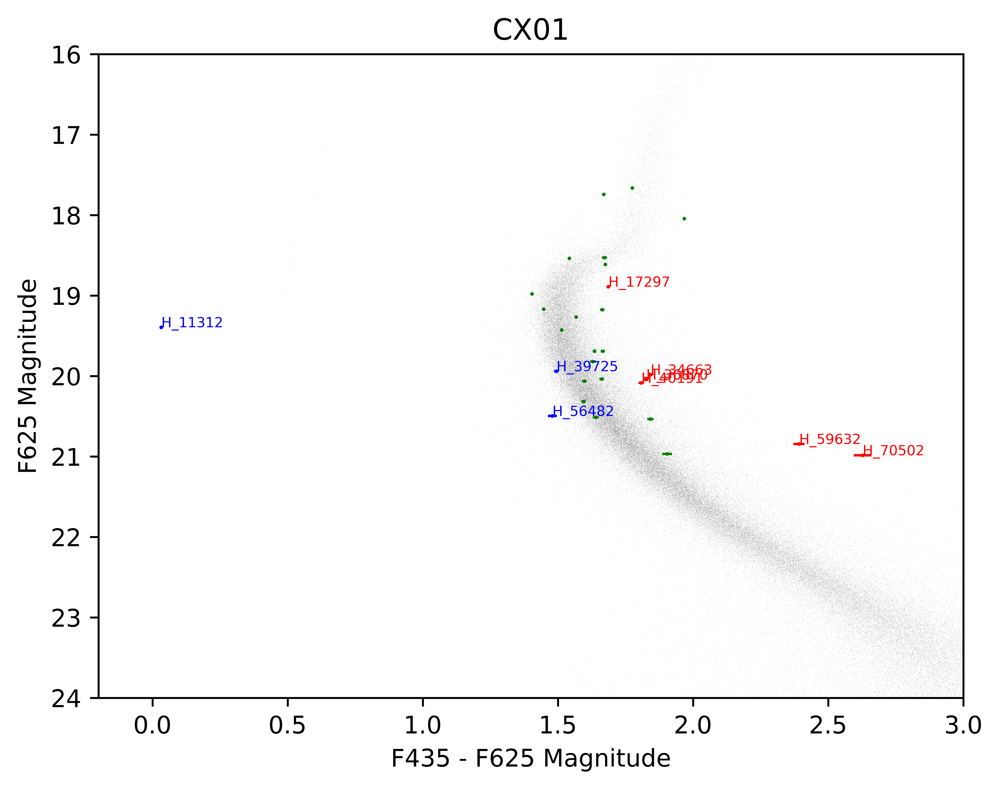

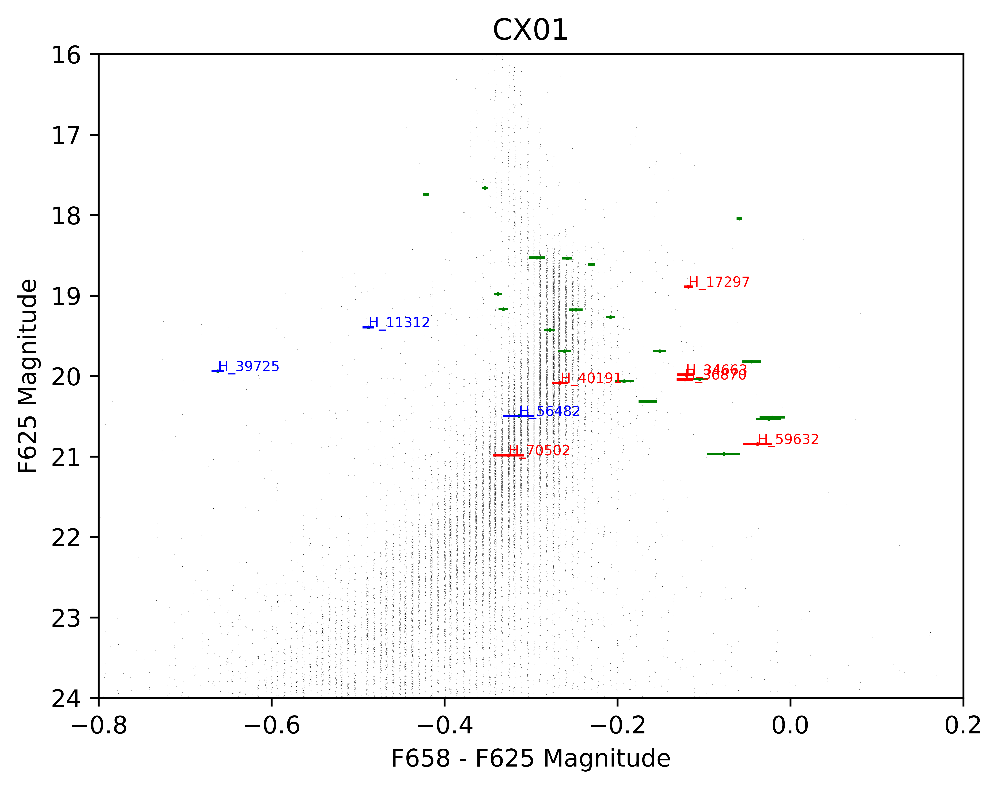

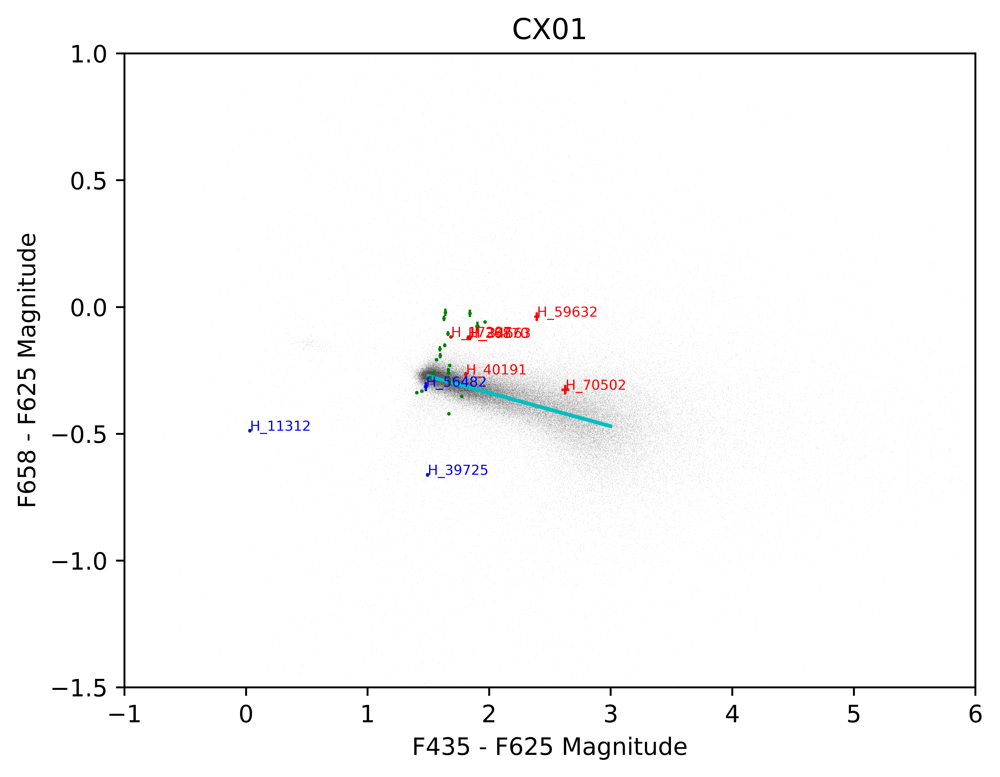

#    F435  F625  F658  Crowd     Chi   Round   Sharp Error ObjType
1  99.999 99.999 14.835 0.052      5.1  0.051 -0.002   0.0     1.0
2  25.182 22.712 23.155 2.459     5.99  0.531 -0.517   0.0     1.0
3  99.999 99.999 15.427 0.011     3.22  0.037  0.003   0.0     1.0
4  18.688 99.999 16.479 0.023     4.93   0.01 -0.026   0.0     1.0
5  24.287 22.074 21.594 0.593      3.9  0.322 -0.602   0.0     1.0
6  19.711 17.883 17.631 0.216    15.22  0.156  -0.18   0.0     1.0
7  22.53  20.575 20.27  0.547      7.0  0.137 -0.447   0.0     1.0
8  22.296 20.609 20.434 0.505      8.3  1.727    0.0   0.0     1.0
9  23.298 20.663 20.528 0.381     7.22  1.148 -0.243   0.0     1.0
10 24.232 21.66  21.476 1.207     8.15  1.188 -0.189   0.0     1.0
11 23.596 21.634 20.861 1.398      6.5    0.4  0.044   0.0     1.0


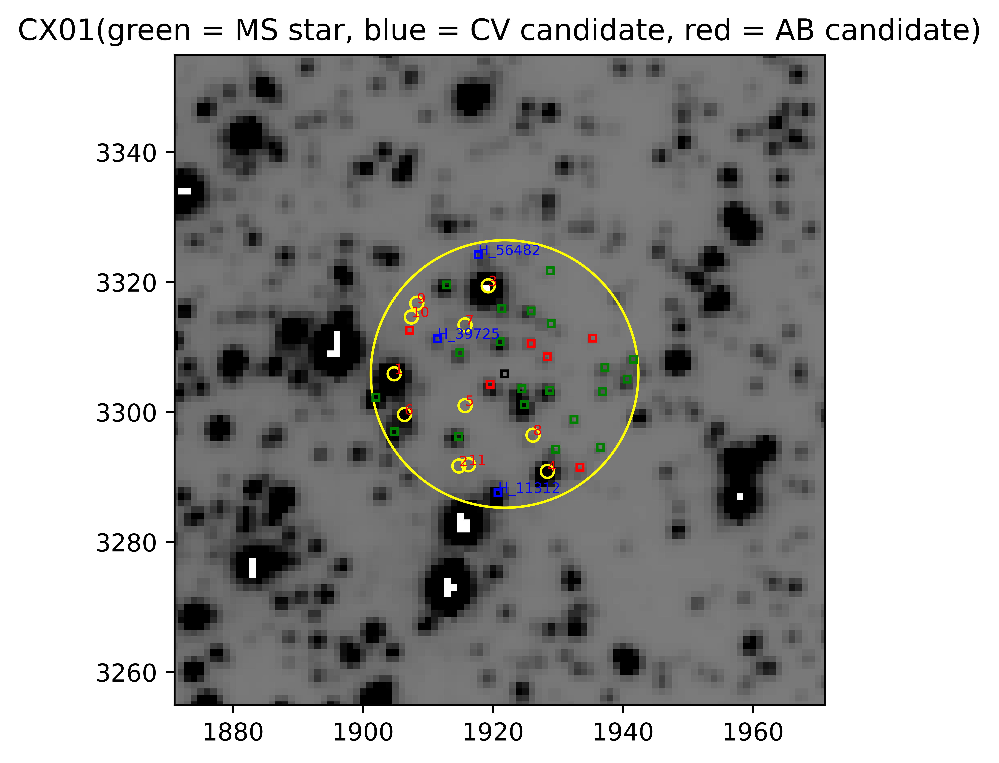

In [6]:
#Field 1
target = 1
outliers = []
AB = []
CV = []

x1 = []
x2 = []
y1 = []
y2 = []

l1 = [1.35, 1.35]
l2 = [20.5, 16]
l3 = [-0.38, -0.38]


target = target - 1 #python indexes at 0
#title = chandraTargets[target].name + ": cMax=" + str(maxCrowding) + ", rMax=" + str(maxRoundness) + ", " + str(minSharp) + "<= s <= " + str(maxSharp) + ", chiMax=" + str(maxChi)
title = chandraTargets[target].name


for i in range(len(dolphotObjects)):
    x1.append(dolphotObjects[i].brColor)
    y1.append(dolphotObjects[i].mag625)
    x2.append(dolphotObjects[i].hrColor)
    y2.append(dolphotObjects[i].mag625)
    
    
###########################################################################################################
#B-R Color
plt.plot(x1, y1, "k,")
#plt.plot(l1, l2, 'g')
plt.gca().invert_yaxis()
plt.xlim(-0.2,3.0)
plt.ylim(24,16)
plt.ylabel('F625 Magnitude')
plt.xlabel('F435 - F625 Magnitude')
plt.title(title)


for i in range(len(candidates)):
    if candidates[i].parent == chandraTargets[target].name:
        plt.plot(candidates[i].brColor, candidates[i].mag625, "g.", markersize = 1)
        plt.errorbar(candidates[i].brColor, candidates[i].mag625, xerr = (candidates[i].sig435**2 + candidates[i].sig625**2)**(1/2), yerr = candidates[i].sig625, elinewidth = 1, ecolor = 'g' )
    if candidates[i].parent == chandraTargets[target].name and candidates[i].brColor <= 1.0:
        plt.plot(candidates[i].brColor, candidates[i].mag625, "b.", markersize = 1)
        plt.errorbar(candidates[i].brColor, candidates[i].mag625, xerr = (candidates[i].sig435**2 + candidates[i].sig625**2)**(1/2), yerr = candidates[i].sig625, elinewidth = 1, ecolor = 'b' )
        plt.text(candidates[i].brColor, candidates[i].mag625, candidates[i].name, color = 'b', fontsize = 'xx-small')
        CV.append(candidates[i])
    if candidates[i].parent == chandraTargets[target].name and candidates[i].brColor <= 1.55 and candidates[i].mag625 >= 19.5:
        plt.plot(candidates[i].brColor, candidates[i].mag625, "b.", markersize = 1)
        plt.errorbar(candidates[i].brColor, candidates[i].mag625, xerr = (candidates[i].sig435**2 + candidates[i].sig625**2)**(1/2), yerr = candidates[i].sig625, elinewidth = 1, ecolor = 'b' )
        plt.text(candidates[i].brColor, candidates[i].mag625, candidates[i].name, color = 'b', fontsize = 'xx-small')
        CV.append(candidates[i])
    if candidates[i].parent == chandraTargets[target].name and candidates[i].mag625 <= 18.9 and candidates[i].mag625 >= 18.75:
        plt.plot(candidates[i].brColor, candidates[i].mag625, "r.", markersize = 1)
        plt.text(candidates[i].brColor, candidates[i].mag625, candidates[i].name, color = 'r', fontsize = 'xx-small')
        plt.errorbar(candidates[i].brColor, candidates[i].mag625, xerr = (candidates[i].sig435**2 + candidates[i].sig625**2)**(1/2), yerr = candidates[i].sig625, elinewidth = 1, ecolor = 'r' )
        AB.append(candidates[i])
    if candidates[i].parent == chandraTargets[target].name and candidates[i].mag625 <= 20.5 and candidates[i].brColor >= 1.8 and candidates[i].brColor <= 1.85:
        plt.plot(candidates[i].brColor, candidates[i].mag625, "r.", markersize = 1)
        plt.errorbar(candidates[i].brColor, candidates[i].mag625, xerr = (candidates[i].sig435**2 + candidates[i].sig625**2)**(1/2), yerr = candidates[i].sig625, elinewidth = 1, ecolor = 'r' )
        plt.text(candidates[i].brColor, candidates[i].mag625, candidates[i].name, color = 'r', fontsize = 'xx-small')
        AB.append(candidates[i])
    if candidates[i].parent == chandraTargets[target].name and candidates[i].brColor >= 2.2:
        plt.plot(candidates[i].brColor, candidates[i].mag625, "r.", markersize = 1)
        plt.text(candidates[i].brColor, candidates[i].mag625, candidates[i].name, color = 'r', fontsize = 'xx-small')
        plt.errorbar(candidates[i].brColor, candidates[i].mag625, xerr = (candidates[i].sig435**2 + candidates[i].sig625**2)**(1/2), yerr = candidates[i].sig625, elinewidth = 1, ecolor = 'r' )
        AB.append(candidates[i])     

#plt.show()
#f = 'C:\\Python\\435-625\\' + chandraTargets[target].name + 'CMD.png'
#plt.savefig(f, bbox_inches='tight')
plt.show()
#plt.close(fig)

###########################################################################################################
#H-R Color

plt.plot(x2, y2, "k,")
#plt.plot(l3, l2, 'g')

for i in range(len(candidates)):
    if candidates[i].parent == chandraTargets[target].name:
        plt.plot(candidates[i].hrColor, candidates[i].mag625, "g.", markersize = 1)
        plt.errorbar(candidates[i].hrColor, candidates[i].mag625, xerr = (candidates[i].sig658**2 + candidates[i].sig625**2)**(1/2), yerr = candidates[i].sig625, elinewidth = 1, ecolor = 'g' )

for i in range(len(CV)):
    plt.plot(CV[i].hrColor, CV[i].mag625, 'b', markersize = 1)
    plt.errorbar(CV[i].hrColor, CV[i].mag625, xerr = (CV[i].sig658**2 + CV[i].sig625**2)**(1/2), yerr = CV[i].sig625, elinewidth = 1, ecolor = 'b' )
    plt.text(CV[i].hrColor, CV[i].mag625, CV[i].name, color = 'blue', fontsize = 'xx-small')
for i in range(len(AB)):
    plt.plot(AB[i].hrColor, AB[i].mag625, 'r.', markersize = 1)
    plt.errorbar(AB[i].hrColor, AB[i].mag625, xerr = (AB[i].sig658**2 + AB[i].sig625**2)**(1/2), yerr = AB[i].sig625, elinewidth = 1, ecolor = 'r' )
    plt.text(AB[i].hrColor, AB[i].mag625, AB[i].name, color = 'red', fontsize = 'xx-small')
plt.gca().invert_yaxis()
plt.xlim(-0.8,0.2)
plt.ylim(24,16)
plt.title(title)
plt.ylabel('F625 Magnitude')
plt.xlabel('F658 - F625 Magnitude')
plt.show()

###########################################################################################################
#Color-Color
plt.plot(x1, x2, "k,")
plt.title(title)
plt.xlabel("F435 - F625 Magnitude")
plt.ylabel("F658 - F625 Magnitude")
plt.xlim(-1,6)
plt.ylim(-1.5,1.0)

regX = []
regY = []
for i in range(len(x1)):
    if x1[i] >= 1.5 and x1[i] <= 3: #and x2[i] <= 0.15 and x2[i] >= -1:
        regX.append(x1[i])
        regY.append(x2[i])
linReg = []
res = scipy.stats.linregress(regX,regY)
for i in range(len(regX)):
    linReg.append(res.intercept + res.slope*regX[i])
plt.plot(regX, linReg,  'c')

#plt.plot([0,6], [0.15, 0.15], 'y')
#plt.plot([0,6], [-1, -1], 'y')
#plt.plot([0,0], [0.15, -1], 'y')
#plt.plot([6,6], [0.15, -1], 'y')

for i in range(len(candidates)):
    if candidates[i].parent == chandraTargets[target].name:
        plt.plot(candidates[i].brColor, candidates[i].hrColor, "g.", markersize = 1)
        plt.errorbar(candidates[i].brColor, candidates[i].hrColor, xerr = (candidates[i].sig435**2 + candidates[i].sig625**2)**(1/2), yerr = ((candidates[i].sig658)**2 + (candidates[i].sig625)**2)**(1/2), elinewidth = 1, ecolor = 'g' )
for i in range(len(CV)):
    plt.plot(CV[i].brColor, CV[i].hrColor, "b", markersize = 1)
    plt.errorbar(CV[i].brColor, CV[i].hrColor, xerr = (CV[i].sig435**2 + CV[i].sig625**2)**(1/2), yerr = ((CV[i].sig658)**2 + (CV[i].sig625)**2)**(1/2), elinewidth = 1, ecolor = 'b' )
    plt.text(CV[i].brColor, CV[i].hrColor, CV[i].name, color = 'blue', fontsize = 'xx-small')
for i in range(len(AB)):
    plt.plot(AB[i].brColor, AB[i].hrColor, 'r', markersize = 1)
    plt.errorbar(AB[i].brColor, AB[i].hrColor, xerr = (AB[i].sig435**2 + AB[i].sig625**2)**(1/2), yerr = ((AB[i].sig658)**2 + (AB[i].sig625)**2)**(1/2), elinewidth = 1, ecolor = 'r' )
    plt.text(AB[i].brColor, AB[i].hrColor, AB[i].name, color = 'red', fontsize = 'xx-small')
plt.show()

xMin = int(chandraTargets[target].X-50)
xMax = int(chandraTargets[target].X+50)
yMin = int(chandraTargets[target].Y-50)
yMax = int(chandraTargets[target].Y+50)


image_data_Hubble = hubble.data
plotDataHubble = image_data_Hubble[xMin:xMax, yMin:yMax]

fig, ax = plt.subplots()

title = chandraTargets[target].name + '(green = MS star, blue = CV candidate, red = AB candidate)'
plt.title(title)
ax.imshow(image_data_Hubble, origin = 'lower', vmin= -2e4, vmax = 2e4, cmap = 'gray_r')
ax.set_xlim(xMin, xMax)
ax.set_ylim(yMin, yMax)

r = Rectangle((chandraTargets[target].X-0.5, chandraTargets[target].Y-0.5), 1, 1, edgecolor = 'black', facecolor = 'none')#, transform = ax.get_transform('pixel'))
ax.add_patch(r)

c = Circle((chandraTargets[target].X, chandraTargets[target].Y), chandraTargets[target].errorR1, edgecolor = 'yellow', facecolor = 'none')
ax.add_patch(c)



for j in range(len(candidates)):
    if candidates[j].parent == chandraTargets[target].name: #and candidates[j].mag625 >= 20.5:
        r2 = Rectangle((candidates[j].X-0.5,candidates[j].Y-0.5), 1, 1, edgecolor = 'green', facecolor = 'none')
        ax.add_patch(r2)

#Highlight potential CVs
for j in range(len(CV)):
    r2 = Rectangle((CV[j].X-0.5, CV[j].Y-0.5), 1, 1, edgecolor = 'blue', facecolor = 'none')
    ax.add_patch(r2)
    plt.text(CV[j].X, CV[j].Y, CV[j].name, color = 'b', fontsize = 'xx-small')
    #outliers.append(candidates[j])   
        
#Highlight potential ABs
for j in range(len(AB)):
    #if AB[j].parent == AB[target].name and AB[j].mag625 >= 1.8:
    r2 = Rectangle((AB[j].X-0.5, AB[j].Y-0.5), 1, 1, edgecolor = 'red', facecolor = 'none')
    ax.add_patch(r2)
    #plt.text(AB[j].X, AB[j].Y, AB[j].name, color = 'r', fontsize = 'xx-small')
       #outliers.append(candidates[j])
        

#Highlight filtered stars
starNum = 1
#plt.text(xMin + 2, yMax -10, '#, Crowd, Chi, Round, Sharp', color = 'r', fontsize = 'xx-small' )
print('%-3s' % '#', '%5s' % 'F435', '%5s' % 'F625', '%5s' % 'F658', '%6s' % 'Crowd', '%7s' % 'Chi', '%7s' % 'Round', '%7s' % 'Sharp', '%5s' % 'Error', '%6s' % 'ObjType')
for j in range(len(xPos)):
    if (mag435[j] == 99.999 or mag625[j] == 99.999 or mag658[j] == 99.999 or crowding[j] > maxCrowding or roundness[j] > maxRoundness or abs(sharpness[j]) > 0.3 or C[j] > maxChi or error[j] > 3 or objType[j] >=3) and ((xPos[j]-chandraTargets[target].X)**2 + (yPos[j]-chandraTargets[target].Y)**2)**(1/2) <= chandraTargets[target].errorR1:
        c = Circle((xPos[j], yPos[j]), 1, edgecolor='yellow', facecolor = 'none')
        
        
        #plt.text(xMin + 2, yMax -10 - 5*starNum, name, color = 'r', fontsize = 'xx-small' )
        #name = str(starNum) + ': ' + str(crowding[j]) + ' ' + str(C[j]) + ' ' + str(roundness[j]) + ' ' + str(sharpness[j])
        print('%-3s' % str(starNum)+ '%-7s' % str(mag435[j])+ '%-7s' % str(mag625[j]) + '%-7s' % str(mag658[j]) + '%-7s' % str(crowding[j]) + '%7s' % str(C[j]) + '%7s' % str(roundness[j]) + '%7s' % str(sharpness[j]) + '%6s' % str(error[j]) + '%8s' % str(objType[j]))
       
        
        
        #Uncomment below to see why stars were removed
        ax.add_patch(c)
        plt.text(xPos[j], yPos[j], starNum, color = 'r', fontsize = 'xx-small')
        starNum = starNum + 1
#f = 'C:\\Python\\fields\\' + chandraTargets[target].name + '.png'
#plt.savefig(f, bbox_inches='tight')
plt.show()

In [4]:
print('%-9s' % '#', '%5s' % 'F435', '%5s' % 'F625', '%5s' % 'F658', '%6s' % 'Crowd', '%7s' % 'Chi', '%7s' % 'Round', '%7s' % 'Sharp', '%5s' % 'Error', '%6s' % 'ObjType', '%8s' % 'fX/fOpt')
for j in range(len(CV)):
    
    print('%-9s' % str(CV[j].name) + '%-7s' % str(CV[j].mag435)+ '%-7s' % str(CV[j].mag625) + '%-7s' % str(CV[j].mag658) + '%-7s' % str(CV[j].crowding) + '%7s' % str(CV[j].chi) + '%7s' % str(CV[j].roundness) + '%7s' % str(CV[j].sharpness) + '%6s' % str(CV[j].error) + '%8s' % str(CV[j].objType) + '%22s' % str(chandraTargets[target].flux / CV[j].flux) )

#          F435  F625  F658  Crowd     Chi   Round   Sharp Error ObjType  fX/fOpt
H_11312  19.425 19.393 18.905 0.635    12.24  0.803  0.046   0.0     1.0   0.11167668358856908
H_39725  21.432 19.938 19.276 0.299     7.38  0.362 -0.134   0.0     1.0   0.18448561504122532
H_56482  21.974 20.495 20.181 0.636     7.52  0.159 -0.116   0.0     1.0     0.308150238660901


In [4]:
print('%-9s' % '#', '%5s' % 'F435', '%5s' % 'F625', '%5s' % 'F658', '%6s' % 'Crowd', '%7s' % 'Chi', '%7s' % 'Round', '%7s' % 'Sharp', '%5s' % 'Error', '%6s' % 'ObjType', '%8s' % 'fX/fOpt')
for j in range(len(AB)):
    
    print('%-9s' % str(AB[j].name) + '%-7s' % str(AB[j].mag435)+ '%-7s' % str(AB[j].mag625) + '%-7s' % str(AB[j].mag658) + '%-7s' % str(AB[j].crowding) + '%7s' % str(AB[j].chi) + '%7s' % str(AB[j].roundness) + '%7s' % str(AB[j].sharpness) + '%6s' % str(AB[j].error) + '%8s' % str(AB[j].objType) + '%22s' % str(chandraTargets[target].flux / AB[j].flux) )

#          F435  F625  F658  Crowd     Chi   Round   Sharp Error ObjType  fX/fOpt
H_17297  20.575 18.889 18.771 0.118    10.18  0.226 -0.111   0.0     1.0   0.07020410521474334
H_34663  21.824 19.982 19.861 0.23      7.16  0.232 -0.096   0.0     1.0   0.19211554556208754
H_36870  21.868 20.042 19.92  0.278     9.61  0.222 -0.265   0.0     1.0    0.2030310723421497
H_40191  21.892 20.084 19.818 0.302     8.05  0.197 -0.165   0.0     1.0    0.2110388970332589
H_59632  23.235 20.843 20.805 0.141     5.66  0.496 -0.151   0.0     1.0   0.42458290916620417
H_70502  23.612 20.985 20.659 0.79       7.3   0.89  -0.12   0.0     1.0    0.4839076729395858


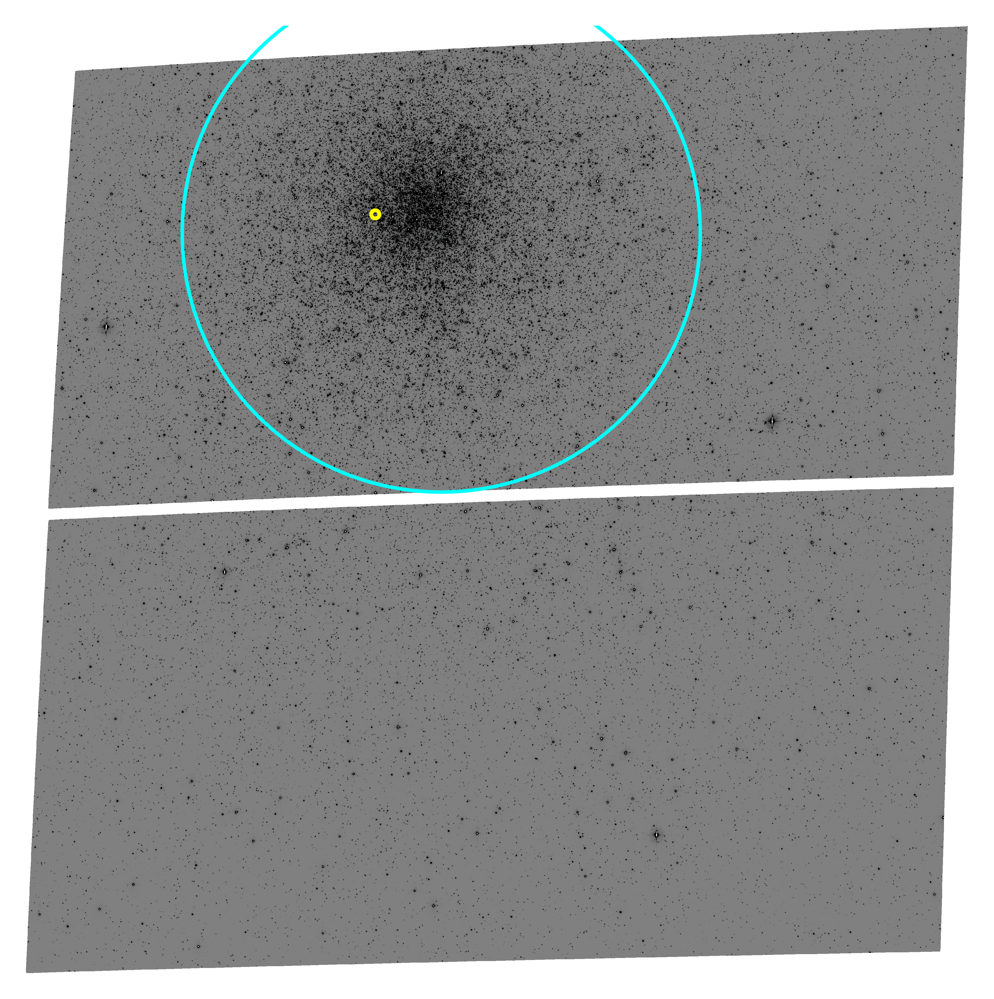

In [6]:
#Distance to 6266 is 1.74 pc and half-light radius is 0.92 arcmin = 55.2 '' * 21 px/arcsec = 1159 pixels for half-light
#Core radius = 0.22 arcmin = 13.2 '' * 21 px/arcsec = 277.2 px for core

def scale_plot_size(factor=10):
    default_dpi = plt.rcParamsDefault['figure.dpi']
    plt.rcParams['figure.dpi'] = default_dpi*factor
    plt.rcParams['agg.path.chunksize'] = 1000

scale_plot_size(10)


image_data_Hubble = hubble.data
plotDataHubble = image_data_Hubble#[xMin:xMax, yMin:yMax]

fig, ax = plt.subplots()


ax.imshow(image_data_Hubble, origin = 'lower', vmin= -5e3, vmax = 5e3, cmap = 'gray_r')
ax.axis('off')

for i in range(len(chandraTargets)):
    

        
    #r = Rectangle((chandraTargets[i].X-0.5, chandraTargets[i].Y-0.5), 1, 1, edgecolor = 'blue', facecolor = 'none')#, transform = ax.get_transform('pixel'))
    #ax.add_patch(r)
    #print(pos.ra, pos.dec)
    
    c = Circle((chandraTargets[14].X-0.5, chandraTargets[14].Y-0.5), chandraTargets[14].errorR1, edgecolor = 'yellow', facecolor = 'none')
    ax.add_patch(c)

    
#SIMBAD coords are alpha = 17 01 12.60, delta =  -30 06 44.5 in ICRS: convert this to FK5

centerRA, centerDEC = '17h01m12.60s', '-30d06m44.5s'

pos = SkyCoord(centerRA, centerDEC, frame='icrs')
pos = pos.transform_to('fk5') #converting to match Hubble ACS
x, y = wcsHubble.world_to_pixel_values(pos.ra, pos.dec)
r = Rectangle((x-0.5, y-0.5), 0, 1, edgecolor = 'green', facecolor = 'none')#, transform = ax.get_transform(wcs))
ax.add_patch(r)

c = Circle((x, y), 1159, edgecolor = 'cyan', facecolor = 'none') #half light
ax.add_patch(c)

c = Circle((x, y), 1887, edgecolor = 'red', facecolor = 'none') #core
#ax.add_patch(c)

#plt.close(fig)

In [8]:
print('%-9s' % '#', '%5s' % 'F435', '%5s' % 'F625', '%5s' % 'F658', '%6s' % 'Crowd', '%7s' % 'Chi', '%7s' % 'Round', '%7s' % 'Sharp', '%5s' % 'Error', '%6s' % 'ObjType')
for j in range(len(CV)):
    
    print('%-9s' % str(CV[j].name) + '%-7s' % str(CV[j].mag435)+ '%-7s' % str(CV[j].mag625) + '%-7s' % str(CV[j].mag658) + '%-7s' % str(CV[j].crowding) + '%7s' % str(CV[j].chi) + '%7s' % str(CV[j].roundness) + '%7s' % str(CV[j].sharpness) + '%6s' % str(CV[j].error) + '%8s' % str(CV[j].objType))

#          F435  F625  F658  Crowd     Chi   Round   Sharp Error ObjType
H_11312  19.425 19.393 18.905 0.635    12.24  0.803  0.046   0.0     1.0
H_39725  21.432 19.938 19.276 0.299     7.38  0.362 -0.134   0.0     1.0
H_56482  21.974 20.495 20.181 0.636     7.52  0.159 -0.116   0.0     1.0


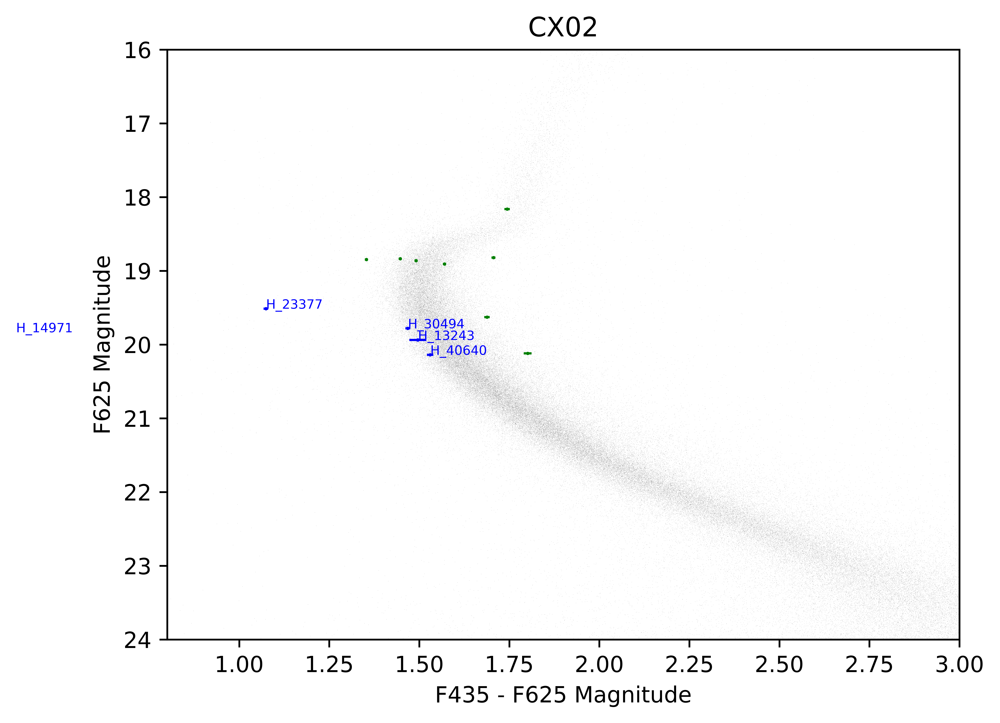

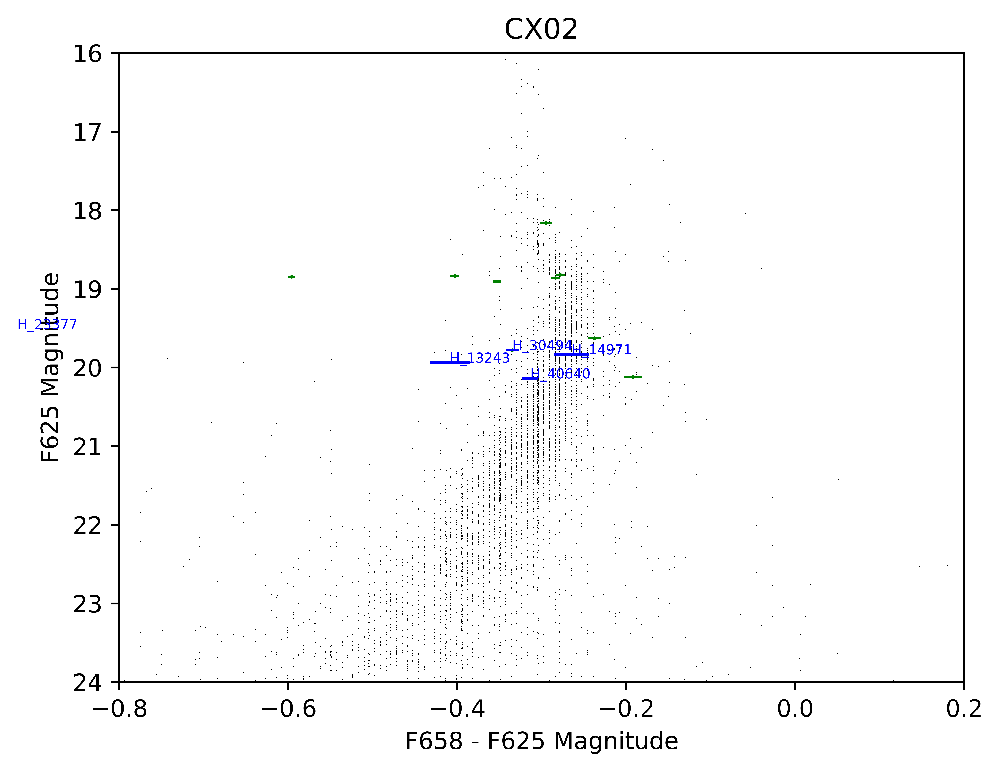

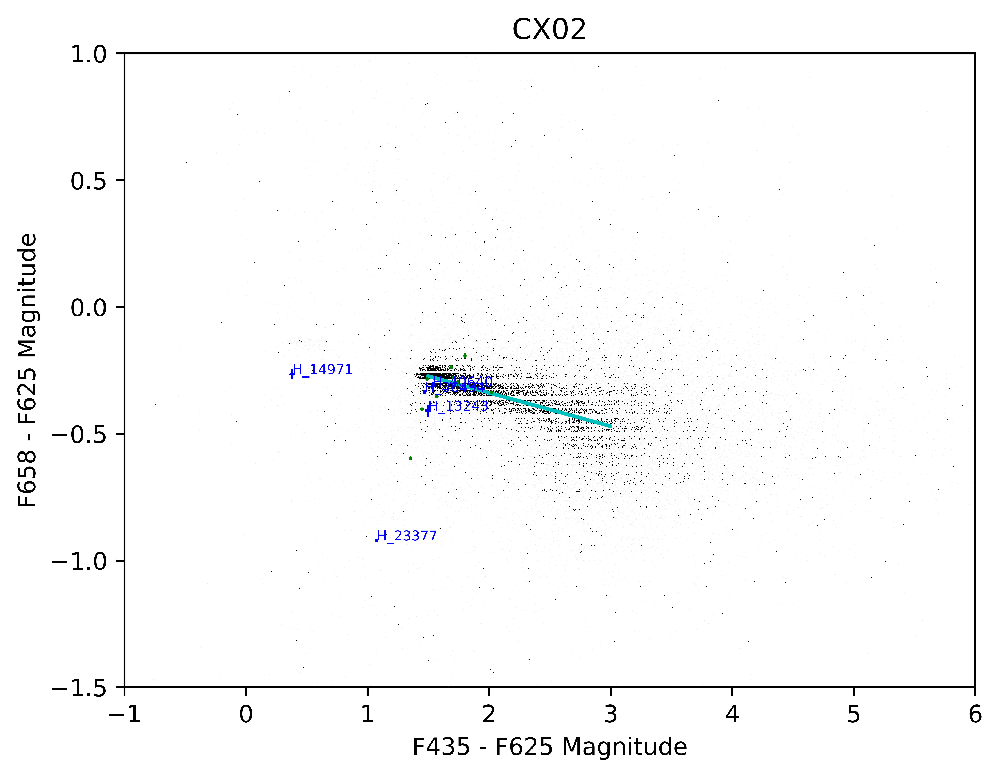

#    F435  F625  F658  Crowd     Chi   Round   Sharp Error ObjType
1  99.999 99.999 99.999 0.118     9.06  0.081   0.11   0.0     1.0
2  99.999 99.999 99.999 1.268    24.57  0.452  0.453   0.0     1.0
3  99.999 16.454 16.268 0.041      6.5  0.068 -0.078   0.0     1.0
4  99.999 99.999 99.999 1.434     21.1  0.436   0.24   0.0     1.0
5  99.999 23.448 22.278 2.132     8.65  0.199   -0.6   0.0     1.0
6  23.132 20.441 19.143 1.089    22.96    0.6 -0.507   0.0     1.0
7  19.519 17.969 17.446 0.344    19.32  0.455 -0.111   0.0     1.0
8  20.317 18.74  18.554 0.463     7.57  1.173 -0.022   0.0     1.0
9  24.222 21.462 20.68  0.614     7.64   0.54 -0.625   0.0     1.0
10 20.767 19.532 18.798 0.405    16.23  0.244 -0.229   0.0     1.0
11 21.381 19.58  19.083 0.749    12.95  1.676 -0.046   0.0     1.0


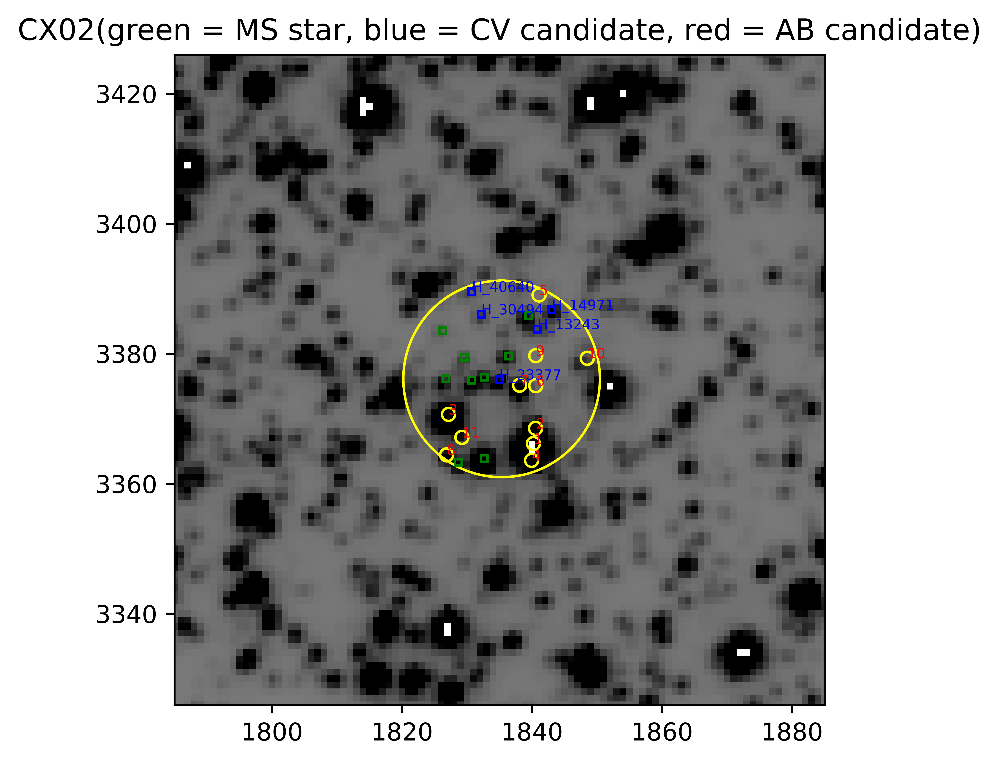

In [7]:
#Field 2
target = 2
AB = []
CV = []

x1 = []
x2 = []
y1 = []
y2 = []

l1 = [1.35, 1.35]
l2 = [20.5, 16]
l3 = [-0.38, -0.38]


target = target - 1 #python indexes at 0
#title = chandraTargets[target].name + ": cMax=" + str(maxCrowding) + ", rMax=" + str(maxRoundness) + ", " + str(minSharp) + "<= s <= " + str(maxSharp) + ", chiMax=" + str(maxChi)
title = chandraTargets[target].name


for i in range(len(dolphotObjects)):
    x1.append(dolphotObjects[i].brColor)
    y1.append(dolphotObjects[i].mag625)
    x2.append(dolphotObjects[i].hrColor)
    y2.append(dolphotObjects[i].mag625)
    
    
###########################################################################################################
#B-R Color
plt.plot(x1, y1, "k,")
#plt.plot(l1, l2, 'g')
plt.gca().invert_yaxis()
plt.xlim(0.8,3.0)
plt.ylim(24,16)
plt.ylabel('F625 Magnitude')
plt.xlabel('F435 - F625 Magnitude')
plt.title(title)


for i in range(len(candidates)):
    if candidates[i].parent == chandraTargets[target].name:
        plt.plot(candidates[i].brColor, candidates[i].mag625, "g.", markersize = 1)
        plt.errorbar(candidates[i].brColor, candidates[i].mag625, xerr = (candidates[i].sig435**2 + candidates[i].sig625**2)**(1/2), yerr = candidates[i].sig625, elinewidth = 1, ecolor = 'g' )
    if candidates[i].parent == chandraTargets[target].name and candidates[i].brColor <= 1.6 and candidates[i].mag625 >= 19.5:
        plt.plot(candidates[i].brColor, candidates[i].mag625, "b.", markersize = 1)
        plt.errorbar(candidates[i].brColor, candidates[i].mag625, xerr = (candidates[i].sig435**2 + candidates[i].sig625**2)**(1/2), yerr = candidates[i].sig625, elinewidth = 1, ecolor = 'b' )
        plt.text(candidates[i].brColor, candidates[i].mag625, candidates[i].name, color = 'b', fontsize = 'xx-small')
        CV.append(candidates[i])
    if candidates[i].parent == chandraTargets[target].name and candidates[i].brColor >= 2.2:
        plt.plot(candidates[i].brColor, candidates[i].mag625, "r.", markersize = 1)
        plt.text(candidates[i].brColor, candidates[i].mag625, candidates[i].name, color = 'r', fontsize = 'xx-small')
        plt.errorbar(candidates[i].brColor, candidates[i].mag625, xerr = (candidates[i].sig435**2 + candidates[i].sig625**2)**(1/2), yerr = candidates[i].sig625, elinewidth = 1, ecolor = 'r' )
        AB.append(candidates[i])       
#plt.show()
#f = 'C:\\Python\\435-625\\' + chandraTargets[target].name + 'CMD.png'
#plt.savefig(f, bbox_inches='tight')
plt.show()
#plt.close(fig)

###########################################################################################################
#H-R Color

plt.plot(x2, y2, "k,")
#plt.plot(l3, l2, 'g')

for i in range(len(candidates)):
    if candidates[i].parent == chandraTargets[target].name:
        plt.plot(candidates[i].hrColor, candidates[i].mag625, "g.", markersize = 1)
        plt.errorbar(candidates[i].hrColor, candidates[i].mag625, xerr = (candidates[i].sig658**2 + candidates[i].sig625**2)**(1/2), yerr = candidates[i].sig625, elinewidth = 1, ecolor = 'g' )
for i in range(len(CV)):
    plt.plot(CV[i].hrColor, CV[i].mag625, 'b', markersize = 1)
    plt.errorbar(CV[i].hrColor, CV[i].mag625, xerr = (CV[i].sig658**2 + CV[i].sig625**2)**(1/2), yerr = CV[i].sig625, elinewidth = 1, ecolor = 'b' )
    plt.text(CV[i].hrColor, CV[i].mag625, CV[i].name, color = 'blue', fontsize = 'xx-small')
for i in range(len(AB)):
    plt.plot(AB[i].hrColor, AB[i].mag625, 'r.', markersize = 1)
    plt.errorbar(AB[i].hrColor, AB[i].mag625, xerr = (AB[i].sig658**2 + AB[i].sig625**2)**(1/2), yerr = AB[i].sig625, elinewidth = 1, ecolor = 'r' )
    plt.text(AB[i].hrColor, AB[i].mag625, AB[i].name, color = 'red', fontsize = 'xx-small')
plt.gca().invert_yaxis()
plt.xlim(-0.8,0.2)
plt.ylim(24,16)
plt.title(title)
plt.ylabel('F625 Magnitude')
plt.xlabel('F658 - F625 Magnitude')
plt.show()

###########################################################################################################
#Color-Color
plt.plot(x1, x2, "k,")
plt.title(title)
plt.xlabel("F435 - F625 Magnitude")
plt.ylabel("F658 - F625 Magnitude")
plt.xlim(-1,6)
plt.ylim(-1.5,1.0)

regX = []
regY = []
for i in range(len(x1)):
    if x1[i] >= 1.5 and x1[i] <= 3: #and x2[i] <= 0.15 and x2[i] >= -1:
        regX.append(x1[i])
        regY.append(x2[i])
linReg = []
res = scipy.stats.linregress(regX,regY)
for i in range(len(regX)):
    linReg.append(res.intercept + res.slope*regX[i])
plt.plot(regX, linReg,  'c')

#plt.plot([0,6], [0.15, 0.15], 'y')
#plt.plot([0,6], [-1, -1], 'y')
#plt.plot([0,0], [0.15, -1], 'y')
#plt.plot([6,6], [0.15, -1], 'y')

for i in range(len(candidates)):
    if candidates[i].parent == chandraTargets[target].name:
        plt.plot(candidates[i].brColor, candidates[i].hrColor, "g.", markersize = 1)
        plt.errorbar(candidates[i].brColor, candidates[i].hrColor, xerr = (candidates[i].sig435**2 + candidates[i].sig625**2)**(1/2), yerr = ((candidates[i].sig658)**2 + (candidates[i].sig625)**2)**(1/2), elinewidth = 1, ecolor = 'g' )
for i in range(len(CV)):
    plt.plot(CV[i].brColor, CV[i].hrColor, "b", markersize = 1)
    plt.errorbar(CV[i].brColor, CV[i].hrColor, xerr = (CV[i].sig435**2 + CV[i].sig625**2)**(1/2), yerr = ((CV[i].sig658)**2 + (CV[i].sig625)**2)**(1/2), elinewidth = 1, ecolor = 'b' )
    plt.text(CV[i].brColor, CV[i].hrColor, CV[i].name, color = 'blue', fontsize = 'xx-small')
for i in range(len(AB)):
    plt.plot(AB[i].brColor, AB[i].hrColor, 'r', markersize = 1)
    plt.errorbar(AB[i].brColor, AB[i].hrColor, xerr = (AB[i].sig435**2 + AB[i].sig625**2)**(1/2), yerr = ((AB[i].sig658)**2 + (AB[i].sig625)**2)**(1/2), elinewidth = 1, ecolor = 'r' )
    plt.text(AB[i].brColor, AB[i].hrColor, AB[i].name, color = 'red', fontsize = 'xx-small')
plt.show()

xMin = int(chandraTargets[target].X-50)
xMax = int(chandraTargets[target].X+50)
yMin = int(chandraTargets[target].Y-50)
yMax = int(chandraTargets[target].Y+50)


image_data_Hubble = hubble.data
plotDataHubble = image_data_Hubble[xMin:xMax, yMin:yMax]

fig, ax = plt.subplots()

title = chandraTargets[target].name + '(green = MS star, blue = CV candidate, red = AB candidate)'
plt.title(title)
ax.imshow(image_data_Hubble, origin = 'lower', vmin= -2e4, vmax = 2e4, cmap = 'gray_r')
ax.set_xlim(xMin, xMax)
ax.set_ylim(yMin, yMax)

r = Rectangle((chandraTargets[target].X-0.5, chandraTargets[target].Y-0.5), 1, 1, edgecolor = 'black', facecolor = 'none')#, transform = ax.get_transform('pixel'))
ax.add_patch(r)

c = Circle((chandraTargets[target].X, chandraTargets[target].Y), chandraTargets[target].errorR1, edgecolor = 'yellow', facecolor = 'none')
ax.add_patch(c)



for j in range(len(candidates)):
    if candidates[j].parent == chandraTargets[target].name: #and candidates[j].mag625 >= 20.5:
        r2 = Rectangle((candidates[j].X-0.5,candidates[j].Y-0.5), 1, 1, edgecolor = 'green', facecolor = 'none')
        ax.add_patch(r2)

#Highlight potential CVs
for j in range(len(CV)):
    r2 = Rectangle((CV[j].X-0.5, CV[j].Y-0.5), 1, 1, edgecolor = 'blue', facecolor = 'none')
    ax.add_patch(r2)
    plt.text(CV[j].X, CV[j].Y, CV[j].name, color = 'b', fontsize = 'xx-small')
    #outliers.append(candidates[j])   
        
#Highlight potential ABs
for j in range(len(AB)):
    #if AB[j].parent == AB[target].name and AB[j].mag625 >= 1.8:
    r2 = Rectangle((AB[j].X-0.5, AB[j].Y-0.5), 1, 1, edgecolor = 'red', facecolor = 'none')
    ax.add_patch(r2)
    plt.text(AB[j].X, AB[j].Y, AB[j].name, color = 'r', fontsize = 'xx-small')
       #outliers.append(candidates[j])
        

#Highlight filtered stars
starNum = 1
#plt.text(xMin + 2, yMax -10, '#, Crowd, Chi, Round, Sharp', color = 'r', fontsize = 'xx-small' )
print('%-3s' % '#', '%5s' % 'F435', '%5s' % 'F625', '%5s' % 'F658', '%6s' % 'Crowd', '%7s' % 'Chi', '%7s' % 'Round', '%7s' % 'Sharp', '%5s' % 'Error', '%6s' % 'ObjType')
for j in range(len(xPos)):
    if (mag435[j] == 99.999 or mag625[j] == 99.999 or mag658[j] == 99.999 or crowding[j] > maxCrowding or roundness[j] > maxRoundness or abs(sharpness[j]) > 0.3 or C[j] > maxChi or error[j] > 3 or objType[j] >=3) and ((xPos[j]-chandraTargets[target].X)**2 + (yPos[j]-chandraTargets[target].Y)**2)**(1/2) <= chandraTargets[target].errorR1:
        c = Circle((xPos[j], yPos[j]), 1, edgecolor='yellow', facecolor = 'none')
        
        
        #plt.text(xMin + 2, yMax -10 - 5*starNum, name, color = 'r', fontsize = 'xx-small' )
        #name = str(starNum) + ': ' + str(crowding[j]) + ' ' + str(C[j]) + ' ' + str(roundness[j]) + ' ' + str(sharpness[j])
        print('%-3s' % str(starNum)+ '%-7s' % str(mag435[j])+ '%-7s' % str(mag625[j]) + '%-7s' % str(mag658[j]) + '%-7s' % str(crowding[j]) + '%7s' % str(C[j]) + '%7s' % str(roundness[j]) + '%7s' % str(sharpness[j]) + '%6s' % str(error[j]) + '%8s' % str(objType[j]))
       
        
        
        #Uncomment below to see why stars were removed
        ax.add_patch(c)
        plt.text(xPos[j], yPos[j], starNum, color = 'r', fontsize = 'xx-small')
        starNum = starNum + 1
#f = 'C:\\Python\\fields\\' + chandraTargets[target].name + '.png'
#plt.savefig(f, bbox_inches='tight')
plt.show()

In [10]:
print('%-9s' % '#', '%5s' % 'F435', '%5s' % 'F625', '%5s' % 'F658', '%6s' % 'Crowd', '%7s' % 'Chi', '%7s' % 'Round', '%7s' % 'Sharp', '%5s' % 'Error', '%6s' % 'ObjType', '%8s' % 'fX/fOpt')
for j in range(len(CV)):
    
    print('%-9s' % str(CV[j].name) + '%-7s' % str(CV[j].mag435)+ '%-7s' % str(CV[j].mag625) + '%-7s' % str(CV[j].mag658) + '%-7s' % str(CV[j].crowding) + '%7s' % str(CV[j].chi) + '%7s' % str(CV[j].roundness) + '%7s' % str(CV[j].sharpness) + '%6s' % str(CV[j].error) + '%8s' % str(CV[j].objType) + '%22s' % str(chandraTargets[target].flux / CV[j].flux) )

#          F435  F625  F658  Crowd     Chi   Round   Sharp Error ObjType  fX/fOpt
H_13243  21.433 19.937 19.528 0.538      9.0  0.144 -0.187   0.0     1.0     7.228000468586996
H_14971  20.212 19.832 19.567 0.281     11.6  0.052 -0.094   0.0     1.0     6.561727217520798
H_23377  20.586 19.512 18.591 0.723    11.73  0.574  0.025   0.0     1.0     4.886728062936915
H_30494  21.246 19.778 19.443 0.187     5.51   0.17 -0.049   0.0     1.0     6.243357044666073
H_40640  21.668 20.138 19.824 0.421     6.94  0.133 -0.097   0.0     1.0     8.697975339993027


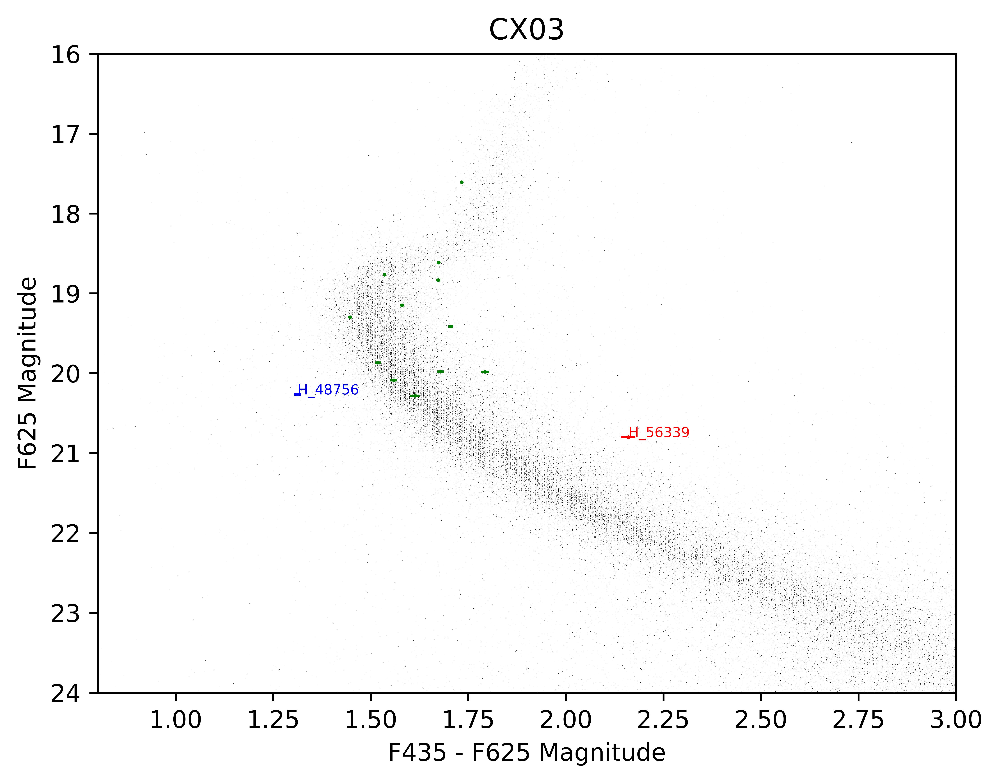

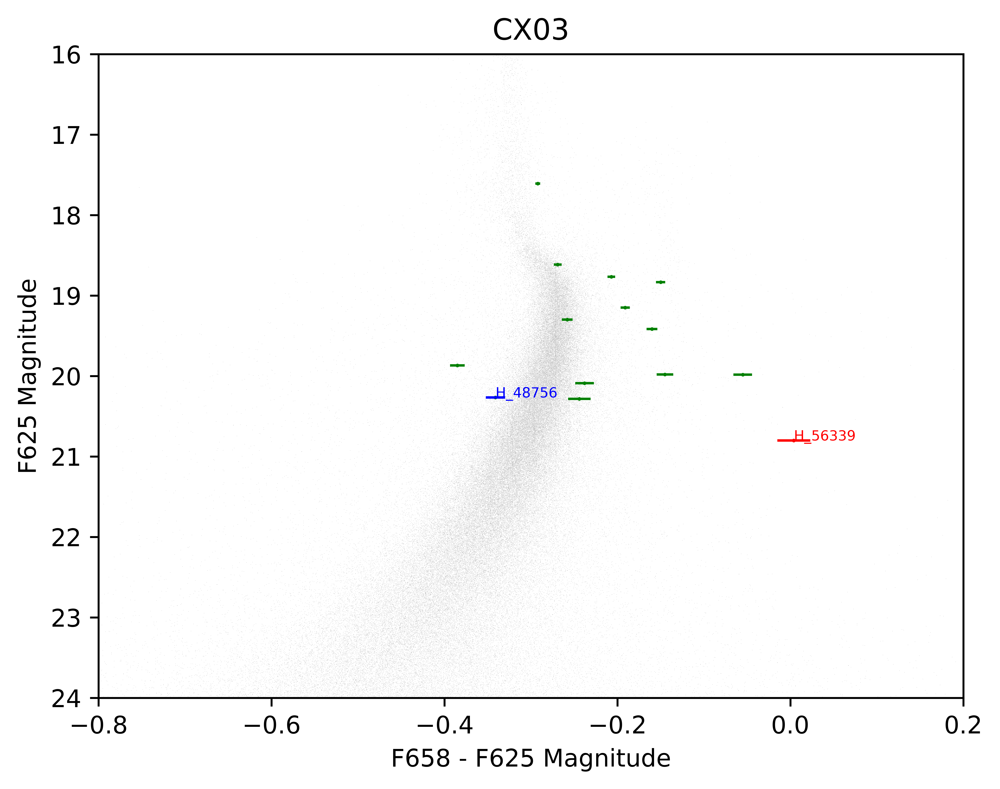

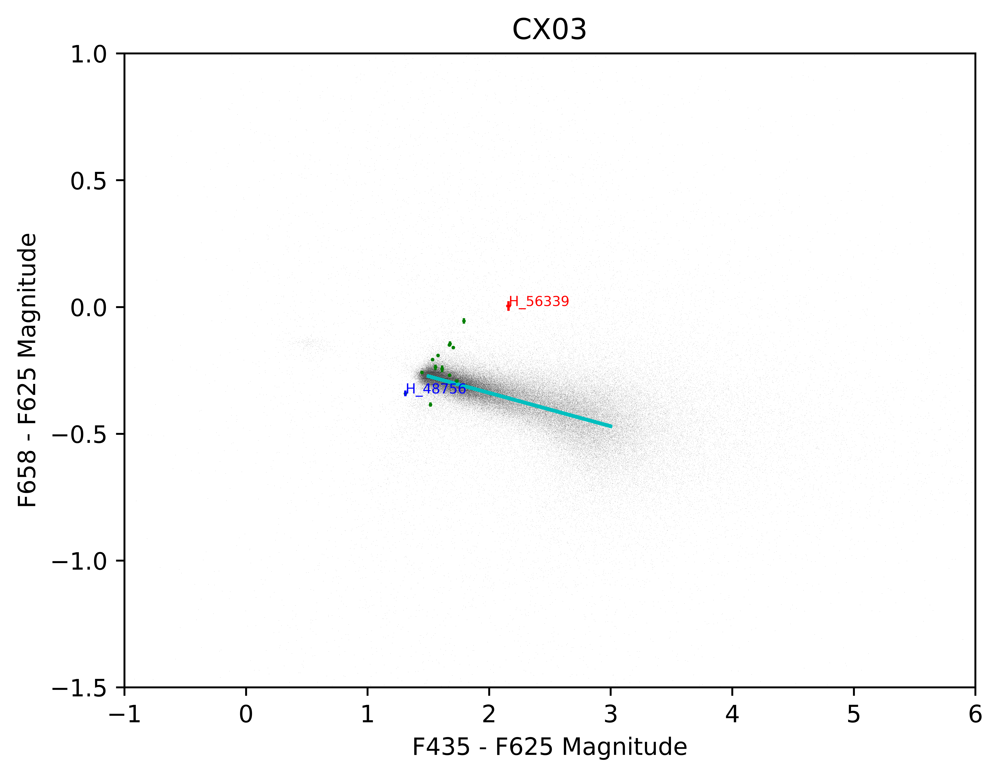

#    F435  F625  F658  Crowd     Chi   Round   Sharp Error ObjType
1  99.999 99.999 99.999 0.031     4.65  0.061   0.02   0.0     1.0
2  99.999 99.999 15.05  0.01      4.89  0.032 -0.024   0.0     1.0
3  20.715 19.728 19.359 1.357    17.69  0.527 -0.285   0.0     1.0
4  21.253 20.529 19.243 1.376    15.68  0.492  0.069   0.0     1.0


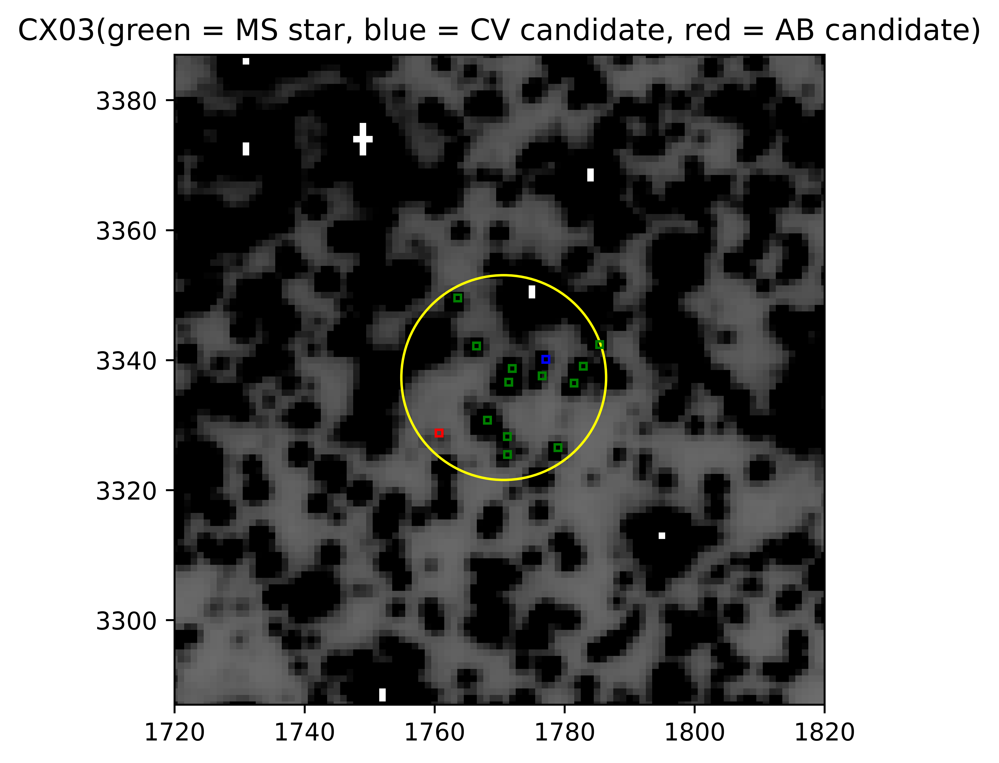

In [12]:
#Field 3
target = 3
AB = []
CV = []

x1 = []
x2 = []
y1 = []
y2 = []

l1 = [1.35, 1.35]
l2 = [20.5, 16]
l3 = [-0.38, -0.38]


target = target - 1 #python indexes at 0
#title = chandraTargets[target].name + ": cMax=" + str(maxCrowding) + ", rMax=" + str(maxRoundness) + ", " + str(minSharp) + "<= s <= " + str(maxSharp) + ", chiMax=" + str(maxChi)
title = chandraTargets[target].name


for i in range(len(dolphotObjects)):
    x1.append(dolphotObjects[i].brColor)
    y1.append(dolphotObjects[i].mag625)
    x2.append(dolphotObjects[i].hrColor)
    y2.append(dolphotObjects[i].mag625)
    
    
###########################################################################################################
#B-R Color
plt.plot(x1, y1, "k,")
#plt.plot(l1, l2, 'g')
plt.gca().invert_yaxis()
plt.xlim(0.8,3.0)
plt.ylim(24,16)
plt.ylabel('F625 Magnitude')
plt.xlabel('F435 - F625 Magnitude')
plt.title(title)


for i in range(len(candidates)):
    if candidates[i].parent == chandraTargets[target].name:
        plt.plot(candidates[i].brColor, candidates[i].mag625, "g.", markersize = 1)
        plt.errorbar(candidates[i].brColor, candidates[i].mag625, xerr = (candidates[i].sig435**2 + candidates[i].sig625**2)**(1/2), yerr = candidates[i].sig625, elinewidth = 1, ecolor = 'g' )
    if candidates[i].parent == chandraTargets[target].name and candidates[i].brColor <= 1.4:
        plt.plot(candidates[i].brColor, candidates[i].mag625, "b.", markersize = 1)
        plt.errorbar(candidates[i].brColor, candidates[i].mag625, xerr = (candidates[i].sig435**2 + candidates[i].sig625**2)**(1/2), yerr = candidates[i].sig625, elinewidth = 1, ecolor = 'b' )
        plt.text(candidates[i].brColor, candidates[i].mag625, candidates[i].name, color = 'b', fontsize = 'xx-small')
        CV.append(candidates[i])
    if candidates[i].parent == chandraTargets[target].name and candidates[i].brColor >= 2:
        plt.plot(candidates[i].brColor, candidates[i].mag625, "r.", markersize = 1)
        plt.text(candidates[i].brColor, candidates[i].mag625, candidates[i].name, color = 'r', fontsize = 'xx-small')
        plt.errorbar(candidates[i].brColor, candidates[i].mag625, xerr = (candidates[i].sig435**2 + candidates[i].sig625**2)**(1/2), yerr = candidates[i].sig625, elinewidth = 1, ecolor = 'r' )
        AB.append(candidates[i])       
#plt.show()
#f = 'C:\\Python\\435-625\\' + chandraTargets[target].name + 'CMD.png'
#plt.savefig(f, bbox_inches='tight')
plt.show()
#plt.close(fig)

###########################################################################################################
#H-R Color

plt.plot(x2, y2, "k,")
#plt.plot(l3, l2, 'g')

for i in range(len(candidates)):
    if candidates[i].parent == chandraTargets[target].name:
        plt.plot(candidates[i].hrColor, candidates[i].mag625, "g.", markersize = 1)
        plt.errorbar(candidates[i].hrColor, candidates[i].mag625, xerr = (candidates[i].sig658**2 + candidates[i].sig625**2)**(1/2), yerr = candidates[i].sig625, elinewidth = 1, ecolor = 'g' )
for i in range(len(CV)):
    plt.plot(CV[i].hrColor, CV[i].mag625, 'b', markersize = 1)
    plt.errorbar(CV[i].hrColor, CV[i].mag625, xerr = (CV[i].sig658**2 + CV[i].sig625**2)**(1/2), yerr = CV[i].sig625, elinewidth = 1, ecolor = 'b' )
    plt.text(CV[i].hrColor, CV[i].mag625, CV[i].name, color = 'blue', fontsize = 'xx-small')
for i in range(len(AB)):
    plt.plot(AB[i].hrColor, AB[i].mag625, 'r.', markersize = 1)
    plt.errorbar(AB[i].hrColor, AB[i].mag625, xerr = (AB[i].sig658**2 + AB[i].sig625**2)**(1/2), yerr = AB[i].sig625, elinewidth = 1, ecolor = 'r' )
    plt.text(AB[i].hrColor, AB[i].mag625, AB[i].name, color = 'red', fontsize = 'xx-small')
plt.gca().invert_yaxis()
plt.xlim(-0.8,0.2)
plt.ylim(24,16)
plt.title(title)
plt.ylabel('F625 Magnitude')
plt.xlabel('F658 - F625 Magnitude')
plt.show()

###########################################################################################################
#Color-Color
plt.plot(x1, x2, "k,")
plt.title(title)
plt.xlabel("F435 - F625 Magnitude")
plt.ylabel("F658 - F625 Magnitude")
plt.xlim(-1,6)
plt.ylim(-1.5,1.0)

regX = []
regY = []
for i in range(len(x1)):
    if x1[i] >= 1.5 and x1[i] <= 3: #and x2[i] <= 0.15 and x2[i] >= -1:
        regX.append(x1[i])
        regY.append(x2[i])
linReg = []
res = scipy.stats.linregress(regX,regY)
for i in range(len(regX)):
    linReg.append(res.intercept + res.slope*regX[i])
plt.plot(regX, linReg,  'c')

#plt.plot([0,6], [0.15, 0.15], 'y')
#plt.plot([0,6], [-1, -1], 'y')
#plt.plot([0,0], [0.15, -1], 'y')
#plt.plot([6,6], [0.15, -1], 'y')

for i in range(len(candidates)):
    if candidates[i].parent == chandraTargets[target].name:
        plt.plot(candidates[i].brColor, candidates[i].hrColor, "g.", markersize = 1)
        plt.errorbar(candidates[i].brColor, candidates[i].hrColor, xerr = (candidates[i].sig435**2 + candidates[i].sig625**2)**(1/2), yerr = ((candidates[i].sig658)**2 + (candidates[i].sig625)**2)**(1/2), elinewidth = 1, ecolor = 'g' )
for i in range(len(CV)):
    plt.plot(CV[i].brColor, CV[i].hrColor, "b", markersize = 1)
    plt.errorbar(CV[i].brColor, CV[i].hrColor, xerr = (CV[i].sig435**2 + CV[i].sig625**2)**(1/2), yerr = ((CV[i].sig658)**2 + (CV[i].sig625)**2)**(1/2), elinewidth = 1, ecolor = 'b' )
    plt.text(CV[i].brColor, CV[i].hrColor, CV[i].name, color = 'blue', fontsize = 'xx-small')
for i in range(len(AB)):
    plt.plot(AB[i].brColor, AB[i].hrColor, 'r', markersize = 1)
    plt.errorbar(AB[i].brColor, AB[i].hrColor, xerr = (AB[i].sig435**2 + AB[i].sig625**2)**(1/2), yerr = ((AB[i].sig658)**2 + (AB[i].sig625)**2)**(1/2), elinewidth = 1, ecolor = 'r' )
    plt.text(AB[i].brColor, AB[i].hrColor, AB[i].name, color = 'red', fontsize = 'xx-small')
plt.show()

xMin = int(chandraTargets[target].X-50)
xMax = int(chandraTargets[target].X+50)
yMin = int(chandraTargets[target].Y-50)
yMax = int(chandraTargets[target].Y+50)


image_data_Hubble = hubble.data
plotDataHubble = image_data_Hubble[xMin:xMax, yMin:yMax]

fig, ax = plt.subplots()

title = chandraTargets[target].name + '(green = MS star, blue = CV candidate, red = AB candidate)'
plt.title(title)
ax.imshow(image_data_Hubble, origin = 'lower', vmin= -5e3, vmax = 5e3, cmap = 'gray_r')
ax.set_xlim(xMin, xMax)
ax.set_ylim(yMin, yMax)

r = Rectangle((chandraTargets[target].X-0.5, chandraTargets[target].Y-0.5), 1, 1, edgecolor = 'black', facecolor = 'none')#, transform = ax.get_transform('pixel'))
ax.add_patch(r)

c = Circle((chandraTargets[target].X, chandraTargets[target].Y), chandraTargets[target].errorR1, edgecolor = 'yellow', facecolor = 'none')
ax.add_patch(c)



for j in range(len(candidates)):
    if candidates[j].parent == chandraTargets[target].name: #and candidates[j].mag625 >= 20.5:
        r2 = Rectangle((candidates[j].X-0.5,candidates[j].Y-0.5), 1, 1, edgecolor = 'green', facecolor = 'none')
        ax.add_patch(r2)

#Highlight potential CVs
for j in range(len(CV)):
    r2 = Rectangle((CV[j].X-0.5, CV[j].Y-0.5), 1, 1, edgecolor = 'blue', facecolor = 'none')
    ax.add_patch(r2)
    #plt.text(CV[j].X, CV[j].Y, CV[j].name, color = 'b', fontsize = 'xx-small')
    #outliers.append(candidates[j])   
        
#Highlight potential ABs
for j in range(len(AB)):
    #if AB[j].parent == AB[target].name and AB[j].mag625 >= 1.8:
    r2 = Rectangle((AB[j].X-0.5, AB[j].Y-0.5), 1, 1, edgecolor = 'red', facecolor = 'none')
    ax.add_patch(r2)
   # plt.text(AB[j].X, AB[j].Y, AB[j].name, color = 'r', fontsize = 'xx-small')
       #outliers.append(candidates[j])
        

#Highlight filtered stars
starNum = 1
#plt.text(xMin + 2, yMax -10, '#, Crowd, Chi, Round, Sharp', color = 'r', fontsize = 'xx-small' )
print('%-3s' % '#', '%5s' % 'F435', '%5s' % 'F625', '%5s' % 'F658', '%6s' % 'Crowd', '%7s' % 'Chi', '%7s' % 'Round', '%7s' % 'Sharp', '%5s' % 'Error', '%6s' % 'ObjType')
for j in range(len(xPos)):
    if (mag435[j] == 99.999 or mag625[j] == 99.999 or mag658[j] == 99.999 or crowding[j] > maxCrowding or roundness[j] > maxRoundness or abs(sharpness[j]) > 0.3 or C[j] > maxChi or error[j] > 3 or objType[j] >=3) and ((xPos[j]-chandraTargets[target].X)**2 + (yPos[j]-chandraTargets[target].Y)**2)**(1/2) <= chandraTargets[target].errorR1:
        c = Circle((xPos[j], yPos[j]), 1, edgecolor='yellow', facecolor = 'none')
        
        
        #plt.text(xMin + 2, yMax -10 - 5*starNum, name, color = 'r', fontsize = 'xx-small' )
        #name = str(starNum) + ': ' + str(crowding[j]) + ' ' + str(C[j]) + ' ' + str(roundness[j]) + ' ' + str(sharpness[j])
        print('%-3s' % str(starNum)+ '%-7s' % str(mag435[j])+ '%-7s' % str(mag625[j]) + '%-7s' % str(mag658[j]) + '%-7s' % str(crowding[j]) + '%7s' % str(C[j]) + '%7s' % str(roundness[j]) + '%7s' % str(sharpness[j]) + '%6s' % str(error[j]) + '%8s' % str(objType[j]))
       
        
        
        #Uncomment below to see why stars were removed
        #ax.add_patch(c)
        #plt.text(xPos[j], yPos[j], starNum, color = 'r', fontsize = 'xx-small')
        starNum = starNum + 1
#f = 'C:\\Python\\fields\\' + chandraTargets[target].name + '.png'
#plt.savefig(f, bbox_inches='tight')
plt.show()

In [11]:
print(chandraTargets[target].X, chandraTargets[target].Y)

1770.6377163846835 3337.3149150479762


In [12]:
print('%-9s' % '#', '%5s' % 'F435', '%5s' % 'F625', '%5s' % 'F658', '%6s' % 'Crowd', '%7s' % 'Chi', '%7s' % 'Round', '%7s' % 'Sharp', '%5s' % 'Error', '%6s' % 'ObjType', '%8s' % 'fX/fOpt')
for j in range(len(CV)):
    
    print('%-9s' % str(CV[j].name) + '%-7s' % str(CV[j].mag435)+ '%-7s' % str(CV[j].mag625) + '%-7s' % str(CV[j].mag658) + '%-7s' % str(CV[j].crowding) + '%7s' % str(CV[j].chi) + '%7s' % str(CV[j].roundness) + '%7s' % str(CV[j].sharpness) + '%6s' % str(CV[j].error) + '%8s' % str(CV[j].objType) + '%22s' % str(chandraTargets[target].flux / CV[j].flux) )

#          F435  F625  F658  Crowd     Chi   Round   Sharp Error ObjType  fX/fOpt
H_48756  21.577 20.265 19.924 0.376    12.85  0.195 -0.047   0.0     1.0    0.8346955462853243


In [ ]:
#Field 4
target = 4
AB = []
CV = []

x1 = []
x2 = []
y1 = []
y2 = []

l1 = [1.35, 1.35]
l2 = [20.5, 16]
l3 = [-0.38, -0.38]


target = target - 1 #python indexes at 0
#title = chandraTargets[target].name + ": cMax=" + str(maxCrowding) + ", rMax=" + str(maxRoundness) + ", " + str(minSharp) + "<= s <= " + str(maxSharp) + ", chiMax=" + str(maxChi)
title = chandraTargets[target].name


for i in range(len(dolphotObjects)):
    x1.append(dolphotObjects[i].brColor)
    y1.append(dolphotObjects[i].mag625)
    x2.append(dolphotObjects[i].hrColor)
    y2.append(dolphotObjects[i].mag625)
    
    
###########################################################################################################
#B-R Color
plt.plot(x1, y1, "k,")
#plt.plot(l1, l2, 'g')
plt.gca().invert_yaxis()
plt.xlim(0.8,3.0)
plt.ylim(24,16)
plt.ylabel('F625 Magnitude')
plt.xlabel('F435 - F625 Magnitude')
plt.title(title)


for i in range(len(candidates)):
    if candidates[i].parent == chandraTargets[target].name:
        plt.plot(candidates[i].brColor, candidates[i].mag625, "g.", markersize = 1)
        plt.errorbar(candidates[i].brColor, candidates[i].mag625, xerr = (candidates[i].sig435**2 + candidates[i].sig625**2)**(1/2), yerr = candidates[i].sig625, elinewidth = 1, ecolor = 'g' )
    if candidates[i].parent == chandraTargets[target].name and candidates[i].brColor <= 1.6 and candidates[i].mag625 >= 20.5:
        plt.plot(candidates[i].brColor, candidates[i].mag625, "b.", markersize = 1)
        plt.errorbar(candidates[i].brColor, candidates[i].mag625, xerr = (candidates[i].sig435**2 + candidates[i].sig625**2)**(1/2), yerr = candidates[i].sig625, elinewidth = 1, ecolor = 'b' )
        plt.text(candidates[i].brColor, candidates[i].mag625, candidates[i].name, color = 'b', fontsize = 'xx-small')
        CV.append(candidates[i])
    if candidates[i].parent == chandraTargets[target].name and candidates[i].brColor <= 1.5 and candidates[i].mag625 >= 19.5:
        plt.plot(candidates[i].brColor, candidates[i].mag625, "b.", markersize = 1)
        plt.errorbar(candidates[i].brColor, candidates[i].mag625, xerr = (candidates[i].sig435**2 + candidates[i].sig625**2)**(1/2), yerr = candidates[i].sig625, elinewidth = 1, ecolor = 'b' )
        plt.text(candidates[i].brColor, candidates[i].mag625, candidates[i].name, color = 'b', fontsize = 'xx-small')
        CV.append(candidates[i])        
    if candidates[i].parent == chandraTargets[target].name and candidates[i].brColor >= 1.65 and candidates[i].mag625 <=20.5:
        plt.plot(candidates[i].brColor, candidates[i].mag625, "r.", markersize = 1)
        plt.text(candidates[i].brColor, candidates[i].mag625, candidates[i].name, color = 'r', fontsize = 'xx-small')
        plt.errorbar(candidates[i].brColor, candidates[i].mag625, xerr = (candidates[i].sig435**2 + candidates[i].sig625**2)**(1/2), yerr = candidates[i].sig625, elinewidth = 1, ecolor = 'r' )
        AB.append(candidates[i])       
#plt.show()
#f = 'C:\\Python\\435-625\\' + chandraTargets[target].name + 'CMD.png'
#plt.savefig(f, bbox_inches='tight')
plt.show()
#plt.close(fig)

###########################################################################################################
#H-R Color

plt.plot(x2, y2, "k,")
#plt.plot(l3, l2, 'g')

for i in range(len(candidates)):
    if candidates[i].parent == chandraTargets[target].name:
        plt.plot(candidates[i].hrColor, candidates[i].mag625, "g.", markersize = 1)
        plt.errorbar(candidates[i].hrColor, candidates[i].mag625, xerr = (candidates[i].sig658**2 + candidates[i].sig625**2)**(1/2), yerr = candidates[i].sig625, elinewidth = 1, ecolor = 'g' )
for i in range(len(CV)):
    plt.plot(CV[i].hrColor, CV[i].mag625, 'b', markersize = 1)
    plt.errorbar(CV[i].hrColor, CV[i].mag625, xerr = (CV[i].sig658**2 + CV[i].sig625**2)**(1/2), yerr = CV[i].sig625, elinewidth = 1, ecolor = 'b' )
    plt.text(CV[i].hrColor, CV[i].mag625, CV[i].name, color = 'blue', fontsize = 'xx-small')
for i in range(len(AB)):
    plt.plot(AB[i].hrColor, AB[i].mag625, 'r.', markersize = 1)
    plt.errorbar(AB[i].hrColor, AB[i].mag625, xerr = (AB[i].sig658**2 + AB[i].sig625**2)**(1/2), yerr = AB[i].sig625, elinewidth = 1, ecolor = 'r' )
    plt.text(AB[i].hrColor, AB[i].mag625, AB[i].name, color = 'red', fontsize = 'xx-small')
plt.gca().invert_yaxis()
plt.xlim(-0.8,0.2)
plt.ylim(24,16)
plt.title(title)
plt.ylabel('F625 Magnitude')
plt.xlabel('F658 - F625 Magnitude')
plt.show()

###########################################################################################################
#Color-Color
plt.plot(x1, x2, "k,")
plt.title(title)
plt.xlabel("F435 - F625 Magnitude")
plt.ylabel("F658 - F625 Magnitude")
plt.xlim(-1,6)
plt.ylim(-1.5,1.0)

regX = []
regY = []
for i in range(len(x1)):
    if x1[i] >= 1.5 and x1[i] <= 3: #and x2[i] <= 0.15 and x2[i] >= -1:
        regX.append(x1[i])
        regY.append(x2[i])
linReg = []
res = scipy.stats.linregress(regX,regY)
for i in range(len(regX)):
    linReg.append(res.intercept + res.slope*regX[i])
plt.plot(regX, linReg,  'c')

#plt.plot([0,6], [0.15, 0.15], 'y')
#plt.plot([0,6], [-1, -1], 'y')
#plt.plot([0,0], [0.15, -1], 'y')
#plt.plot([6,6], [0.15, -1], 'y')

for i in range(len(candidates)):
    if candidates[i].parent == chandraTargets[target].name:
        plt.plot(candidates[i].brColor, candidates[i].hrColor, "g.", markersize = 1)
        plt.errorbar(candidates[i].brColor, candidates[i].hrColor, xerr = (candidates[i].sig435**2 + candidates[i].sig625**2)**(1/2), yerr = ((candidates[i].sig658)**2 + (candidates[i].sig625)**2)**(1/2), elinewidth = 1, ecolor = 'g' )
for i in range(len(CV)):
    plt.plot(CV[i].brColor, CV[i].hrColor, "b", markersize = 1)
    plt.errorbar(CV[i].brColor, CV[i].hrColor, xerr = (CV[i].sig435**2 + CV[i].sig625**2)**(1/2), yerr = ((CV[i].sig658)**2 + (CV[i].sig625)**2)**(1/2), elinewidth = 1, ecolor = 'b' )
    plt.text(CV[i].brColor, CV[i].hrColor, CV[i].name, color = 'blue', fontsize = 'xx-small')
for i in range(len(AB)):
    plt.plot(AB[i].brColor, AB[i].hrColor, 'r', markersize = 1)
    plt.errorbar(AB[i].brColor, AB[i].hrColor, xerr = (AB[i].sig435**2 + AB[i].sig625**2)**(1/2), yerr = ((AB[i].sig658)**2 + (AB[i].sig625)**2)**(1/2), elinewidth = 1, ecolor = 'r' )
    plt.text(AB[i].brColor, AB[i].hrColor, AB[i].name, color = 'red', fontsize = 'xx-small')
plt.show()

xMin = int(chandraTargets[target].X-50)
xMax = int(chandraTargets[target].X+50)
yMin = int(chandraTargets[target].Y-50)
yMax = int(chandraTargets[target].Y+50)


image_data_Hubble = hubble.data
plotDataHubble = image_data_Hubble[xMin:xMax, yMin:yMax]

fig, ax = plt.subplots()

title = chandraTargets[target].name + '(green = MS star, blue = CV candidate, red = AB candidate)'
plt.title(title)
ax.imshow(image_data_Hubble, origin = 'lower', vmin= -5e3, vmax = 5e3, cmap = 'gray_r')
ax.set_xlim(xMin, xMax)
ax.set_ylim(yMin, yMax)

r = Rectangle((chandraTargets[target].X-0.5, chandraTargets[target].Y-0.5), 1, 1, edgecolor = 'black', facecolor = 'none')#, transform = ax.get_transform('pixel'))
ax.add_patch(r)

c = Circle((chandraTargets[target].X, chandraTargets[target].Y), chandraTargets[target].errorR1, edgecolor = 'yellow', facecolor = 'none')
ax.add_patch(c)



for j in range(len(candidates)):
    if candidates[j].parent == chandraTargets[target].name: #and candidates[j].mag625 >= 20.5:
        r2 = Rectangle((candidates[j].X-0.5,candidates[j].Y-0.5), 1, 1, edgecolor = 'green', facecolor = 'none')
        ax.add_patch(r2)

#Highlight potential CVs
for j in range(len(CV)):
    r2 = Rectangle((CV[j].X-0.5, CV[j].Y-0.5), 1, 1, edgecolor = 'blue', facecolor = 'none')
    ax.add_patch(r2)
    plt.text(CV[j].X, CV[j].Y, CV[j].name, color = 'b', fontsize = 'xx-small')
    #outliers.append(candidates[j])   
        
#Highlight potential ABs
for j in range(len(AB)):
    #if AB[j].parent == AB[target].name and AB[j].mag625 >= 1.8:
    r2 = Rectangle((AB[j].X-0.5, AB[j].Y-0.5), 1, 1, edgecolor = 'red', facecolor = 'none')
    ax.add_patch(r2)
    plt.text(AB[j].X, AB[j].Y, AB[j].name, color = 'r', fontsize = 'xx-small')
       #outliers.append(candidates[j])
        

#Highlight filtered stars
starNum = 1
#plt.text(xMin + 2, yMax -10, '#, Crowd, Chi, Round, Sharp', color = 'r', fontsize = 'xx-small' )
#print('%-3s' % '#', '%5s' % 'F435', '%5s' % 'F625', '%5s' % 'F658', '%6s' % 'Crowd', '%7s' % 'Chi', '%7s' % 'Round', '%7s' % 'Sharp', '%5s' % 'Error', '%6s' % 'ObjType')
for j in range(len(xPos)):
    if (mag435[j] == 99.999 or mag625[j] == 99.999 or mag658[j] == 99.999 or crowding[j] > maxCrowding or roundness[j] > maxRoundness or abs(sharpness[j]) > 0.3 or C[j] > maxChi or error[j] > 3 or objType[j] >=3) and ((xPos[j]-chandraTargets[target].X)**2 + (yPos[j]-chandraTargets[target].Y)**2)**(1/2) <= chandraTargets[target].errorR1:
        c = Circle((xPos[j], yPos[j]), 1, edgecolor='yellow', facecolor = 'none')
        
        
        #plt.text(xMin + 2, yMax -10 - 5*starNum, name, color = 'r', fontsize = 'xx-small' )
        #name = str(starNum) + ': ' + str(crowding[j]) + ' ' + str(C[j]) + ' ' + str(roundness[j]) + ' ' + str(sharpness[j])
        #print('%-3s' % str(starNum)+ '%-7s' % str(mag435[j])+ '%-7s' % str(mag625[j]) + '%-7s' % str(mag658[j]) + '%-7s' % str(crowding[j]) + '%7s' % str(C[j]) + '%7s' % str(roundness[j]) + '%7s' % str(sharpness[j]) + '%6s' % str(error[j]) + '%8s' % str(objType[j]))
       
        
        
        #Uncomment below to see why stars were removed
        #ax.add_patch(c)
        #plt.text(xPos[j], yPos[j], starNum, color = 'r', fontsize = 'xx-small')
        #starNum = starNum + 1
#f = 'C:\\Python\\fields\\' + chandraTargets[target].name + '.png'
#plt.savefig(f, bbox_inches='tight')
plt.show()

In [ ]:
print('%-9s' % '#', '%5s' % 'F435', '%5s' % 'F625', '%5s' % 'F658', '%6s' % 'Crowd', '%7s' % 'Chi', '%7s' % 'Round', '%7s' % 'Sharp', '%5s' % 'Error', '%6s' % 'ObjType', '%8s' % 'fX/fOpt')
for j in range(len(CV)):
    
    print('%-9s' % str(CV[j].name) + '%-7s' % str(CV[j].mag435)+ '%-7s' % str(CV[j].mag625) + '%-7s' % str(CV[j].mag658) + '%-7s' % str(CV[j].crowding) + '%7s' % str(CV[j].chi) + '%7s' % str(CV[j].roundness) + '%7s' % str(CV[j].sharpness) + '%6s' % str(CV[j].error) + '%8s' % str(CV[j].objType) + '%22s' % str(chandraTargets[target].flux / CV[j].flux) )

In [ ]:
#Field 5
target = 5
AB = []
CV = []

x1 = []
x2 = []
y1 = []
y2 = []

l1 = [1.35, 1.35]
l2 = [20.5, 16]
l3 = [-0.38, -0.38]


target = target - 1 #python indexes at 0
#title = chandraTargets[target].name + ": cMax=" + str(maxCrowding) + ", rMax=" + str(maxRoundness) + ", " + str(minSharp) + "<= s <= " + str(maxSharp) + ", chiMax=" + str(maxChi)
title = chandraTargets[target].name


for i in range(len(dolphotObjects)):
    x1.append(dolphotObjects[i].brColor)
    y1.append(dolphotObjects[i].mag625)
    x2.append(dolphotObjects[i].hrColor)
    y2.append(dolphotObjects[i].mag625)
    
    
###########################################################################################################
#B-R Color
plt.plot(x1, y1, "k,")
#plt.plot(l1, l2, 'g')
plt.gca().invert_yaxis()
plt.xlim(0.8,3.0)
plt.ylim(24,16)
plt.ylabel('F625 Magnitude')
plt.xlabel('F435 - F625 Magnitude')
plt.title(title)


for i in range(len(candidates)):
    if candidates[i].parent == chandraTargets[target].name:
        plt.plot(candidates[i].brColor, candidates[i].mag625, "g.", markersize = 1)
        plt.errorbar(candidates[i].brColor, candidates[i].mag625, xerr = (candidates[i].sig435**2 + candidates[i].sig625**2)**(1/2), yerr = candidates[i].sig625, elinewidth = 1, ecolor = 'g' )
    if candidates[i].parent == chandraTargets[target].name and candidates[i].brColor <= 1.5:
        plt.plot(candidates[i].brColor, candidates[i].mag625, "b.", markersize = 1)
        plt.errorbar(candidates[i].brColor, candidates[i].mag625, xerr = (candidates[i].sig435**2 + candidates[i].sig625**2)**(1/2), yerr = candidates[i].sig625, elinewidth = 1, ecolor = 'b' )
        plt.text(candidates[i].brColor, candidates[i].mag625, candidates[i].name, color = 'b', fontsize = 'xx-small')
        CV.append(candidates[i])
    if candidates[i].parent == chandraTargets[target].name and candidates[i].brColor >= 1.75:# and candidates[i].brColor <=2.1:
        plt.plot(candidates[i].brColor, candidates[i].mag625, "r.", markersize = 1)
        plt.text(candidates[i].brColor, candidates[i].mag625, candidates[i].name, color = 'r', fontsize = 'xx-small')
        plt.errorbar(candidates[i].brColor, candidates[i].mag625, xerr = (candidates[i].sig435**2 + candidates[i].sig625**2)**(1/2), yerr = candidates[i].sig625, elinewidth = 1, ecolor = 'r' )
        AB.append(candidates[i])       
#plt.show()
#f = 'C:\\Python\\435-625\\' + chandraTargets[target].name + 'CMD.png'
#plt.savefig(f, bbox_inches='tight')
plt.show()
#plt.close(fig)

###########################################################################################################
#H-R Color

plt.plot(x2, y2, "k,")
#plt.plot(l3, l2, 'g')

for i in range(len(candidates)):
    if candidates[i].parent == chandraTargets[target].name:
        plt.plot(candidates[i].hrColor, candidates[i].mag625, "g.", markersize = 1)
        plt.errorbar(candidates[i].hrColor, candidates[i].mag625, xerr = (candidates[i].sig658**2 + candidates[i].sig625**2)**(1/2), yerr = candidates[i].sig625, elinewidth = 1, ecolor = 'g' )
for i in range(len(CV)):
    plt.plot(CV[i].hrColor, CV[i].mag625, 'b', markersize = 1)
    plt.errorbar(CV[i].hrColor, CV[i].mag625, xerr = (CV[i].sig658**2 + CV[i].sig625**2)**(1/2), yerr = CV[i].sig625, elinewidth = 1, ecolor = 'b' )
    plt.text(CV[i].hrColor, CV[i].mag625, CV[i].name, color = 'blue', fontsize = 'xx-small')
for i in range(len(AB)):
    plt.plot(AB[i].hrColor, AB[i].mag625, 'r.', markersize = 1)
    plt.errorbar(AB[i].hrColor, AB[i].mag625, xerr = (AB[i].sig658**2 + AB[i].sig625**2)**(1/2), yerr = AB[i].sig625, elinewidth = 1, ecolor = 'r' )
    plt.text(AB[i].hrColor, AB[i].mag625, AB[i].name, color = 'red', fontsize = 'xx-small')
plt.gca().invert_yaxis()
plt.xlim(-0.8,0.2)
plt.ylim(24,16)
plt.title(title)
plt.ylabel('F625 Magnitude')
plt.xlabel('F658 - F625 Magnitude')
plt.show()

###########################################################################################################
#Color-Color
plt.plot(x1, x2, "k,")
plt.title(title)
plt.xlabel("F435 - F625 Magnitude")
plt.ylabel("F658 - F625 Magnitude")
plt.xlim(-1,6)
plt.ylim(-1.5,1.0)

regX = []
regY = []
for i in range(len(x1)):
    if x1[i] >= 1.5 and x1[i] <= 3: #and x2[i] <= 0.15 and x2[i] >= -1:
        regX.append(x1[i])
        regY.append(x2[i])
linReg = []
res = scipy.stats.linregress(regX,regY)
for i in range(len(regX)):
    linReg.append(res.intercept + res.slope*regX[i])
plt.plot(regX, linReg,  'c')

#plt.plot([0,6], [0.15, 0.15], 'y')
#plt.plot([0,6], [-1, -1], 'y')
#plt.plot([0,0], [0.15, -1], 'y')
#plt.plot([6,6], [0.15, -1], 'y')

for i in range(len(candidates)):
    if candidates[i].parent == chandraTargets[target].name:
        plt.plot(candidates[i].brColor, candidates[i].hrColor, "g.", markersize = 1)
        plt.errorbar(candidates[i].brColor, candidates[i].hrColor, xerr = (candidates[i].sig435**2 + candidates[i].sig625**2)**(1/2), yerr = ((candidates[i].sig658)**2 + (candidates[i].sig625)**2)**(1/2), elinewidth = 1, ecolor = 'g' )
for i in range(len(CV)):
    plt.plot(CV[i].brColor, CV[i].hrColor, "b", markersize = 1)
    plt.errorbar(CV[i].brColor, CV[i].hrColor, xerr = (CV[i].sig435**2 + CV[i].sig625**2)**(1/2), yerr = ((CV[i].sig658)**2 + (CV[i].sig625)**2)**(1/2), elinewidth = 1, ecolor = 'b' )
    plt.text(CV[i].brColor, CV[i].hrColor, CV[i].name, color = 'blue', fontsize = 'xx-small')
for i in range(len(AB)):
    plt.plot(AB[i].brColor, AB[i].hrColor, 'r', markersize = 1)
    plt.errorbar(AB[i].brColor, AB[i].hrColor, xerr = (AB[i].sig435**2 + AB[i].sig625**2)**(1/2), yerr = ((AB[i].sig658)**2 + (AB[i].sig625)**2)**(1/2), elinewidth = 1, ecolor = 'r' )
    plt.text(AB[i].brColor, AB[i].hrColor, AB[i].name, color = 'red', fontsize = 'xx-small')
plt.show()

xMin = int(chandraTargets[target].X-50)
xMax = int(chandraTargets[target].X+50)
yMin = int(chandraTargets[target].Y-50)
yMax = int(chandraTargets[target].Y+50)


image_data_Hubble = hubble.data
plotDataHubble = image_data_Hubble[xMin:xMax, yMin:yMax]

fig, ax = plt.subplots()

title = chandraTargets[target].name + '(green = MS star, blue = CV candidate, red = AB candidate)'
plt.title(title)
ax.imshow(image_data_Hubble, origin = 'lower', vmin= -5e3, vmax = 5e3, cmap = 'gray_r')
ax.set_xlim(xMin, xMax)
ax.set_ylim(yMin, yMax)

r = Rectangle((chandraTargets[target].X-0.5, chandraTargets[target].Y-0.5), 1, 1, edgecolor = 'black', facecolor = 'none')#, transform = ax.get_transform('pixel'))
ax.add_patch(r)

c = Circle((chandraTargets[target].X, chandraTargets[target].Y), chandraTargets[target].errorR1, edgecolor = 'yellow', facecolor = 'none')
ax.add_patch(c)



for j in range(len(candidates)):
    if candidates[j].parent == chandraTargets[target].name: #and candidates[j].mag625 >= 20.5:
        r2 = Rectangle((candidates[j].X-0.5,candidates[j].Y-0.5), 1, 1, edgecolor = 'green', facecolor = 'none')
        ax.add_patch(r2)

#Highlight potential CVs
for j in range(len(CV)):
    r2 = Rectangle((CV[j].X-0.5, CV[j].Y-0.5), 1, 1, edgecolor = 'blue', facecolor = 'none')
    ax.add_patch(r2)
    plt.text(CV[j].X, CV[j].Y, CV[j].name, color = 'b', fontsize = 'xx-small')
    #outliers.append(candidates[j])   
        
#Highlight potential ABs
for j in range(len(AB)):
    #if AB[j].parent == AB[target].name and AB[j].mag625 >= 1.8:
    r2 = Rectangle((AB[j].X-0.5, AB[j].Y-0.5), 1, 1, edgecolor = 'red', facecolor = 'none')
    ax.add_patch(r2)
    plt.text(AB[j].X, AB[j].Y, AB[j].name, color = 'r', fontsize = 'xx-small')
       #outliers.append(candidates[j])
        

#Highlight filtered stars
starNum = 1
#plt.text(xMin + 2, yMax -10, '#, Crowd, Chi, Round, Sharp', color = 'r', fontsize = 'xx-small' )
#print('%-3s' % '#', '%5s' % 'F435', '%5s' % 'F625', '%5s' % 'F658', '%6s' % 'Crowd', '%7s' % 'Chi', '%7s' % 'Round', '%7s' % 'Sharp', '%5s' % 'Error', '%6s' % 'ObjType')
for j in range(len(xPos)):
    if (mag435[j] == 99.999 or mag625[j] == 99.999 or mag658[j] == 99.999 or crowding[j] > maxCrowding or roundness[j] > maxRoundness or abs(sharpness[j]) > 0.3 or C[j] > maxChi or error[j] > 3 or objType[j] >=3) and ((xPos[j]-chandraTargets[target].X)**2 + (yPos[j]-chandraTargets[target].Y)**2)**(1/2) <= chandraTargets[target].errorR1:
        c = Circle((xPos[j], yPos[j]), 1, edgecolor='yellow', facecolor = 'none')
        
        
        #plt.text(xMin + 2, yMax -10 - 5*starNum, name, color = 'r', fontsize = 'xx-small' )
        #name = str(starNum) + ': ' + str(crowding[j]) + ' ' + str(C[j]) + ' ' + str(roundness[j]) + ' ' + str(sharpness[j])
        #print('%-3s' % str(starNum)+ '%-7s' % str(mag435[j])+ '%-7s' % str(mag625[j]) + '%-7s' % str(mag658[j]) + '%-7s' % str(crowding[j]) + '%7s' % str(C[j]) + '%7s' % str(roundness[j]) + '%7s' % str(sharpness[j]) + '%6s' % str(error[j]) + '%8s' % str(objType[j]))
       
        
        
        #Uncomment below to see why stars were removed
        #ax.add_patch(c)
        #plt.text(xPos[j], yPos[j], starNum, color = 'r', fontsize = 'xx-small')
        #starNum = starNum + 1
#f = 'C:\\Python\\fields\\' + chandraTargets[target].name + '.png'
#plt.savefig(f, bbox_inches='tight')
plt.show()

In [ ]:
print('%-9s' % '#', '%5s' % 'F435', '%5s' % 'F625', '%5s' % 'F658', '%6s' % 'Crowd', '%7s' % 'Chi', '%7s' % 'Round', '%7s' % 'Sharp', '%5s' % 'Error', '%6s' % 'ObjType', '%8s' % 'fX/fOpt')
for j in range(len(CV)):
    
    print('%-9s' % str(CV[j].name) + '%-7s' % str(CV[j].mag435)+ '%-7s' % str(CV[j].mag625) + '%-7s' % str(CV[j].mag658) + '%-7s' % str(CV[j].crowding) + '%7s' % str(CV[j].chi) + '%7s' % str(CV[j].roundness) + '%7s' % str(CV[j].sharpness) + '%6s' % str(CV[j].error) + '%8s' % str(CV[j].objType) + '%22s' % str(chandraTargets[target].flux / CV[j].flux) )

In [ ]:
print(chandraTargets[5].flux)